<a href="https://colab.research.google.com/github/RoyPoulami/X-axis-parameter-generation-Neurokit/blob/main/Copy_of_Holter_Ver_5_1_1_(dispersion_coefficienct_and_colour_coding_added_next_day_timestamp_fetching_added__New_R_code_added_and_testing_phase).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Short Holter Version 5.1
Timestamp and lines-per-page custamisability retained

Cumulative Summary sheet replaced by Page-wise Summary which includes:


*   Heart Rate: Max, Min, Avg
*   Count of Pause
*   Count of Ectopic





# Client Access

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!mkdir -p ~/.google/carditek-ecg
!cp /content/drive/MyDrive/Colaboratory/dot-google/client_secret.json ~/.google/carditek-ecg

%cd /content/drive/MyDrive/Colaboratory/dot-google/python-client-master/carditek/cloud/client
import buffer
import client


client = client.Client()


workspace ='/content/drive/My Drive/Colaboratory/Carditek TIFF Files/CAL_PULSE/'
background = '/content/drive/My Drive/Colaboratory/Carditek TIFF Files'
import sys; sys.path.append(workspace)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1q0cNRCNl-FiQ1sdRz_H4Qa7dtYD-81-B/Colaboratory/dot-google/python-client-master/carditek/cloud/client


# Functions & Packages

In [ ]:
!pip install pytz
!pip install condat-tv
!pip install python-docx

import condat_tv
from google.colab import files
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import math
import pandas as pd
import scipy as sp
from PIL import Image, ImageDraw, ImageFont
from scipy import signal
import collections
import statistics as st
from collections import deque
import time
import matplotlib.backends.backend_pdf
import datetime
from pytz import timezone
%matplotlib inline
import statistics
from scipy.stats import linregress
import itertools
from docx import Document
import os
from datetime import datetime, timedelta
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import collections
# import pandas as pd
# import numpy as np
from concurrent.futures import ThreadPoolExecutor

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 kB 5.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for condat-tv: filename=condat_tv-0.0.5-cp311-cp311-linux_x86_64.whl size=251137 sha256=343b4e97cf72ae4678bae42e831e484837479b6c00542ce6cae090734961e7d2
  Stored in directory: /root/.cache/pip/wheels/07/1a/43/602d9685fbeb9fd5ee4e03aa7e946e2fc4915decb80bb984fd
Successfully built condat-tv
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 9.8 MB/s eta 0:00:00


In [ ]:
## function extracts values from a dictionary given a specific index ##
def Value_axis(data_dict,value):
  data=list(data_dict.items())
  an_array=np.array(data,dtype=object)
  Values_1=an_array[value]
  Values_2=np.asarray(Values_1[1])
  return Values_2


def ecg_filters_Smooth_holter(lead_data,Fs=1000):
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [21/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [1.5/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_45 = sp.signal.lfilter(d, c, filt_50)#*(0.000286)
  smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
  return smoothed


def noise_removal_holter(lead_data, Fs=1000):
    # Low-pass Butterworth filter
    d, c = signal.butter(4, 21/(Fs/2), btype='low', analog=False)

    # High-pass Butterworth filter
    b, a = signal.butter(3, 1.5/(Fs/2), btype='high', analog=False)

    # Notch filter for 50Hz noise
    f, e = signal.iirnotch(50, 30, Fs)

    # Filter chain: high-pass -> notch -> low-pass
    filt_BW = signal.filtfilt(b, a, lead_data)
    filt_50 = signal.filtfilt(f, e, filt_BW)  # using filtfilt for phase compensation
    filt_final = signal.filtfilt(d, c, filt_50)

    # Savitzky-Golay smoothing
    smoothed = signal.savgol_filter(filt_final, window_length=51, polyorder=3)

    return smoothed


def ecg_filters_Smooth_holter_V2(lead_data,Fs=1000): #WITH SMOOTHINING FILTER
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [25/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [3/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  h, g = signal.butter(1, [30/500] , btype='low', analog=False)
  j, i = signal.butter(1, [3/500] , btype='low', analog=False)

  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_SM = (signal.lfilter(j, i, filt_50))
  filt_LP = (signal.lfilter(h, g, filt_50))*0.000286

  sparse = filt_LP - filt_SM;
  denoise = condat_tv.tv_denoise(sparse,7.65)
  smooth_data = filt_BW+denoise
  return filt_50

def ecg_filters_Rpeak(lead_data):
  d, c = sp.signal.butter(6, [25/500] , btype='low', analog=False)
  #b = signal.firwin(1735, cutoff = [5/500], window = "hamming", pass_zero=False); a = 1 ########### Baseline filter for Display
  b, a = signal.cheby1(4, 1, [7/500], 'high', analog=False) ############ Baseline filter for R Peak detation
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*0.000286
  filt_45 = sp.signal.lfilter(d, c, filt_BW)
  return filt_45

## R peak detection: Filters the input ECG lead data to enhance R-peaks for detection ##
def R_Peak_Detection_03(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);

  for i in range(0,n):
    win=50;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
      peaks_u = start_win + max_peak[0];
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  peaks_up = peaks_up[1:len(peaks_up)-2]
  return peaks_up



# def R_Peak_Detection_03(raw_data):
#   peaks_up = []; amp = [];
#   b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
#   h, g = signal.butter(4, [45/500] , btype='low', analog=False)
#   filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
#   data_D = np.diff(data_F); data_S = data_D*data_D
#   peaks,rpeak = signal.find_peaks(data_S,distance = 400,height=(max(data_S[1000:5000])/4));n = len(peaks);  ####  we are using diff signals instead of square signal

#   for i in range(0,n):
#     win=50;
#     if (peaks[i]-(win))<0: start_win = 0
#     else: start_win = (peaks[i]-(win))
#     seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;
#     max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
#     if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
#       peaks_u = start_win + max_peak[0];
#     else: peaks_u = start_win + np.argmax(seg)
#     peaks_up.append(peaks_u);
#   #peaks_up = peaks_up[0:len(peaks_up)-2]
#   return peaks_up



def ecg_filters_V5_01(lead_data):  #### According to IEC 60601-2-25 (BW, 50, 100 and LP) with smoothing
  # for x in  range(1,len(lead_data),1):
  #     if (lead_data[x] == 0):
  #      lead_data[x] = lead_data[x-1]

 ##### Baseline filter without ST Segment distortion
  b = signal.firwin(2377, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
 ##### Powerline noise and its harmonics removal
  Fs = 1000; F0 = 50; F1 = F0*2; r = 1 -((3.14*2)/1000); W0 = (2*3.14*F0)/Fs; W1 = (2*3.14*F1)/Fs
  d0 = 1; d1 = -2*(np.cos(W0)); d2 = 1; c2 = 1; c1 = -2*r*(np.cos(W0)); c0 = r * r; d = [d2, d1, d0]; c = [c2, c1, c0]
  f0 = 1; f1 = -2*(np.cos(W1)); f2 = 1; e2 = 1; e1 = -2*r*(np.cos(W1)); e0 = r * r; f = [f2, f1, f0]; e = [e2, e1, e0]
 ##### 150Hz Low pass filter
  h, g = sp.signal.butter(4, [145/500] , btype='low', analog=False)

  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  filt_50 = sp.signal.lfilter(d, c, filt_BW); filt_100 = sp.signal.lfilter(f, e, filt_50)
  filt_LP = sp.signal.lfilter(h, g, filt_50)
  smoothed = sp.signal.savgol_filter(filt_LP, window_length =51, polyorder = 3)
  return smoothed


########### DATA ADDITION
def Data_addidtion(input_signal, lines_per_page):
  LEN = len(input_signal)/15000
  reminder=LEN%lines_per_page; count = 0
  endBuff = collections.deque(np.full([15000,],2000,dtype=int))
  while (reminder%lines_per_page)!= 0:
    count = count+1
    input_signal = np.concatenate((input_signal, endBuff))
    reminder = (len(input_signal)/15000)%lines_per_page
  return input_signal

########### HEART RATE & R-DETECTION
def RR_calculation11(input_signal):
  # input_signal=data_loss(input_signal)
  # b = sp.signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1 ;  filt_BW = sp.signal.filtfilt(b, a, input_signal)
  # d, c = sp.signal.butter(15, [35/500] , btype='low', analog=False); filtered = sp.signal.lfilter(d, c, filt_BW);#filtered = filtered*filtered;
  filtered = ectopic_filters(input_signal)
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 300,height=(max(filtered[1000:5000])/2))
  IntRR=np.empty(len(peaks)-1)
  for i in range(1,len(peaks)):
    ch = peaks[i]-peaks[i-1]
    if ch>250: IntRR[i-1] = ch;
  return (peaks, IntRR)

def HeartRate_parameters11(Rpeak_buff,RRinterval,input_signal):
  # Rpeak_buff,RRinterval = RR_calculation11(input_signal); #print("RR_interval :",RRinterval)
  # Avg_HR = int(round((60*Fs)/np.mean(RRinterval)))   # average heart rate
  normalRR = []; pause_duration = []; pause_location = []; loc = len(input_signal)-np.sum(RRinterval); ch = 0
  for k in RRinterval:
    if k>=2000:
      pause_duration.append(k); pause_location.append(loc)
    elif k>250 and k<3000:
      normalRR.append(k); loc = int(loc+k)

  if len(normalRR)>=2:
    max_HR = int(round((60*Fs)/np.min(normalRR)));  #print("max ",np.min(normalRR))
    min_HR = int(round((60*Fs)/np.max(normalRR))); #print("min ",np.max(normalRR))
    Avg_HR = int(round((60*Fs)/np.mean(normalRR)))   # average heart rate
  else: max_HR=math.nan; min_HR=math.nan; Avg_HR=math.nan
  HeartRate = [Avg_HR, max_HR, min_HR]; #print(HeartRate)
  Pause_det = [pause_duration, pause_location]
  return (HeartRate, Pause_det)

def SVT_check(peaks, RR_int):
  i=0; SVT_beat=0; SVT_episode = 0
  SVT_st = collections.deque(); SVT_sp = collections.deque()
  while i<len(RR_int):
    if RR_int[i]<=460:
      SVT_st.append(peaks[i])
      while RR_int[i]<=460:
        SVT_beat = SVT_beat+1
        sp = peaks[i]
        i=i+1
      SVT_st.append(peaks[i-SVT_beat]); SVT_sp.append(sp);
      SVT_episode = SVT_episode+1
      SVT_beat=0
    else:
      i=i+1
  return(SVT_episode, SVT_st, SVT_sp)


############ NOISE DETECTION
# def data_loss(input_signal):
#   for x in  range(1,len(input_signal)-1,1):    #### data loss
#     if (input_signal[x] == 0):
#       input_signal[x] = input_signal[x-1] #st.mean([input_signal[x-1], input_signal[x+1]])
#   return (input_signal)

def SNR_estimation(data):
  Data = np.array(data)
  ideal_SNR = 2
  b, a = sp.signal.butter(7, [35/500] , btype='low', analog=False); sig = sp.signal.filtfilt(b, a, Data)
  d, c = sp.signal.butter(7, [35/500] , btype='high', analog=False); nos = sp.signal.filtfilt(d, c, Data)
  def SNR_Cal(sig,noi):
    return (np.sqrt(np.mean(sig**2)))/(np.sqrt(np.mean(noi**2)))
  SNR_seg = SNR_Cal(Data,nos); #print(SNR_seg)
  if (SNR_seg > ideal_SNR):
    return (1)    #### Good Segment
  else:
    return (0)   #### Bad Segment

def movement_artifact(data):
  avg_val = round(np.mean(data));
  range_lower = round(np.min(data)); range_higher = round(np.max(data))
  lower_deviation = np.subtract(avg_val,range_lower); higher_deviation = np.subtract(range_higher,avg_val)
  if ((lower_deviation<=10 and lower_deviation>=1) and (higher_deviation<=10 and higher_deviation>=1)):
    return (1)    #### Good Segment
  else:
    return(0)     #### Bad Segment

def Noise_estimation(data):
  count = 0; window = 5000; data_buff = []; segment = []
  b = signal.firwin(1735, cutoff = [0.67/500], window = "hamming", pass_zero=False); a = 1
  num = (sp.signal.filtfilt(b, a, data))*0.000286   #baseline filter
  # num = data_loss(num)      #eliminating data loss
  noise_coeff = 0
  for t in num:
      data_buff.append(t)
      count  = count +1
      if count == window:
        Criteria1 = movement_artifact(data_buff);   Criteria2 = SNR_estimation(data_buff)
        count = 0
        if (Criteria1==1) and (Criteria2==1):
          noise_coeff=noise_coeff+1    #no noise
  return noise_coeff

###########   MACHINE DISSCONNECT FOR 15 SEC
def machine_diconnect_15sec(input_frame):
  zerocount = 0; startloc=0
  MD = False; i=0
  while (MD!=True)and(i!=len(input_frame)):
    if input_frame[i]==0:zerocount = zerocount+1
    else:zerocount = 0
    if zerocount>=1000:
      MD=True; startloc=i-zerocount
    i+=1
  if MD==True:
    k=len(input_frame)-startloc; l=k*10; t = np.linspace(0, 2, 15000-startloc, endpoint = True)
    dis_seg=sp.signal.square(2 * np.pi * l * t)*20000
    print(len(input_frame[0:startloc]))
    outdata = np.array(np.concatenate((input_frame[0:startloc],dis_seg)))
    return(outdata, MD)
  else: return (input_frame, MD)


########### READING ALL TIMESTAMP DATA
def read_ECG_concate(start_timestamp, MAC, read=250, skp=20):
  ts=start_timestamp
  lead1=[]; lead2=[]; lead3=[]; v1_lead=[]; v2_lead=[];
  v3_lead=[]; v4_lead=[]; v5_lead=[]; v6_lead=[];
  year=[]; time_all=[]; stamplist=[];
  end=0; skip=0; Tmax=0


  bufferloop = {}; fra = {}; buffer = client.fetch(MAC,(start_timestamp)); frame =  buffer.frame
  Patient_name=buffer.patient_name; Phone_number=buffer.patient_phone
  print(Patient_name, Phone_number)

  while end!=read:
    bufferloop = {}; fra = {}; buffer = client.fetch(MacId,(ts));
    if buffer != None:
      if (buffer.patient_name==Patient_name) and (buffer.patient_phone==Phone_number):
        skip=0;
        frame=buffer.frame; #print(Tmax, Patient_name, MacId, ts)
        lead1 = np.concatenate((lead1,frame.i)); lead2 = np.concatenate((lead2,frame.ii)); lead3 = np.concatenate((lead3,frame.iii));
        v1_lead = np.concatenate((v1_lead,frame.v1)); v2_lead = np.concatenate((v2_lead,frame.v2)); v3_lead = np.concatenate((v3_lead,frame.v3));
        v4_lead = np.concatenate((v4_lead,frame.v4)); v5_lead = np.concatenate((v5_lead,frame.v5)); v6_lead = np.concatenate((v6_lead,frame.v6));

        stamplist.append(ts)
        y,t=get_time_from_timestamp(ts)
        time_all.append(t); year.append(y)
        ts=ts+15; Tmax +=1; #print(Tmax)
        end+=1
    elif skip<=skp:
      ts=ts+15; skip=skip+1; print("skip ",skip, ts)
    else:
      print("End of patient data")
      break;
  print("Number of Timestamps read : ",int(len(lead1)/15000))

  print(len(stamplist))
  Patient_det = [Patient_name, Phone_number]

  avr_lead = -(lead2+lead1)/2; avl_lead = lead1-(lead2/2); avf_lead = lead2-(lead1/2);

  Date_frame = pd.DataFrame(list(zip(stamplist,time_all, year)),columns=['All_Timestamp','All_Time','Date'])
  lead_frame = pd.DataFrame(list(zip(lead1,lead2,lead3,avr_lead,avl_lead, avf_lead,v1_lead,v2_lead,v3_lead,v4_lead,v5_lead,v6_lead)),
                            columns =['Lead_1','Lead_2','Lead_3','AVR','AVL','AVF','V1','V2','V3','V4','V5','V6'], dtype = float)
  return(Patient_det, lead_frame, Date_frame)


############     ECTOPIC DETECTION
def bandpass(low, high, fs=1000, order=25):
    return sp.signal.butter(order, [low, high], fs=fs, btype='bandpass',
    #return sp.cheby1(4, 1, [low, high], btype='bandpass', analog=True,
    output='sos')

def ectopic_filters(signal):
  lead_data = signal #data_loss(signal)
  Baseline = sp.signal.medfilt(lead_data, kernel_size=401)
  BW_Filtered = lead_data - Baseline
  sos = bandpass(0.5, 20,fs=1000, order=3)
  filtered = (sp.signal.sosfilt(sos, BW_Filtered))
  return filtered

def QRS(complex):
  comp = complex; diff = np.diff(comp,n=1); sqr = np.square(diff); norm = sqr/max(sqr)
  count_on = 0; count_off = 0
  for i in range(0,100):
    if norm[i]<0.005:count_on = count_on+1
    QRSON = 0+count_on
  for i in range(150,249):
    if norm[i]<0.006: count_off = count_off+1
    QRSOFF = 249-count_off
  return (QRSOFF - QRSON)

def find_ectopic(signal, template):
  peaks,rpeak = sp.signal.find_peaks(signal,distance = 400,height=(max(signal[1000:5000])/4))
  peaks = peaks[1:len(peaks)-1];peak_len = len(peaks) ## 1st and last peak removed to avoid incomplete beats/complex
  Ramp = Value_axis(rpeak,0); Ramp = Ramp[0:len(Ramp)-1]
  AUC = collections.deque(); RR_int = collections.deque();
  ##    LIST OF RR INTERVALS
  for i in range(1, len(peaks)):    RR_int.append(peaks[i]-peaks[i-1])
  ##    INDIVIDUAL COMPLEX EXTRACTION
  com_width = round(Fs//(8));
  ecg = np.zeros((peak_len,com_width*2)); start_p = np.empty([peak_len],dtype=int); end_p = np.empty([peak_len],dtype=int)
  for i in  range(peak_len):
    start_p[i] = peaks[i]-com_width; end_p[i] = peaks[i]+com_width
    ecg[i] = signal[start_p[i]:end_p[i]]
  ##   LIST OF AREA UNDER THE CURVE
  for j in ecg:
    area = np.trapz(j);
    AUC.append(area)
  ##    ECTOPIC FUNCTION
  PVC_list = np.empty_like(peaks, dtype=float); PVC_list[:] = np.NaN
  SVC_list = np.empty_like(peaks, dtype=float); SVC_list[:] = np.NaN
  AUC = np.array(AUC); prev_ect=0
  for i in range(1, len(RR_int)):
    if len(AUC[0:i-1])!=0: medAUC = st.median(AUC[0:i-1])
    else: medAUC= AUC[0]
    if RR_int[i]>=(1.6*RR_int[i-1]):
      if AUC[i]>(1.3*medAUC):
        PVC_list[i] = peaks[i]
      else: # less area undercurve
        SVC_list[i] = peaks[i]
  return SVC_list, PVC_list, len(SVC_list)

############    FETCHING SPECIFIED LEAD FROM DATAFRAME
def fetch_lead(Lead):
  if Lead=='1': return  (np.array(LeadFrame.Lead_1))
  elif Lead=='2': return (np.array(LeadFrame.Lead_2))
  elif Lead=='3': return (np.array(LeadFrame.Lead_3))
  elif Lead.casefold()=='avr': return (np.array(LeadFrame.AVR))
  elif Lead.casefold()=='avl': return (np.array(LeadFrame.AVL))
  elif Lead.casefold()=='avf': return (np.array(LeadFrame.AVF))
  elif Lead.casefold()=='v1': return (np.array(LeadFrame.V1))
  elif Lead.casefold()=='v2': return (np.array(LeadFrame.V2))
  elif Lead.casefold()=='v3': return (np.array(LeadFrame.V3))
  elif Lead.casefold()=='v4': return (np.array(LeadFrame.V4))
  elif Lead.casefold()=='v5': return (np.array(LeadFrame.V5))
  elif Lead.casefold()=='v6': return (np.array(LeadFrame.V6))
  else : return (np.array(LeadFrame.Lead_2))

###########   GENERATING REPORT : 1TS per line/ heart rate and pause/ plot and create pdf in patient name
def Report_generation(Lead, Patient, MacId, Date, TS, HIS, Timestamp_per_line=1,lines_per_page=60, Noise_detection=True):
  buff=fetch_lead(Lead);  buff = collections.deque(Data_addidtion(buff, lines_per_page))
  temp_buff =  np.array(buff)
  page=0; tsum=0; line=[]; linecount=lines_per_page;
  HRV_line =[]; TotPause =[]; MaxHR = []; MinHR = [];
  countlen=len(buff); samples_per_line = 15000*Timestamp_per_line
  _,time = get_time_from_timestamp(Timestamp)
  HolterTitle = 'SYDÄNTEK Short Holter'; plot_header=("%s       %s      Start:%d      Date:%s %s"%(Patient[0],MacId,Timestamp,Date.at[0,'Date'],str(time)))
  filtered = ectopic_filters(temp_buff[0:6000])
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/4))
  com_width = round(Fs//(8)); start_p = peaks[1]-com_width; end_p = peaks[1]+com_width
  template = filtered[start_p:end_p]

  ########### HOLTER LINE PLOTTING
  def plotting_ver1(sig, iteration):
    sig=data_loss(sig); SV_len = 0; PV_len = 0; NB_len = 0
    sig, state = machine_diconnect_15sec(sig)
    if state==False:    ##no disconnect
      HR_line, Pause_line = HeartRate_parameters11(ecg_filters_Rpeak(sig))
      HRV_line.append(HR_line[0]); MaxHR.append(HR_line[1]); MinHR.append(HR_line[2])
      SV, PV, NB = find_ectopic(sig, template);
      ax[iteration].plot(h,(ecg_filters_V5_01(sig)),'k',linewidth=0.4);  ###########################  Gain adjustement
      for n in SV:
        ax[iteration].axvspan(n-150, n+150, alpha=0.2, color="green")
        if math.isnan(n)==False: SV_len = SV_len+1
      for n in PV:
        ax[iteration].axvspan(n-150, n+150, alpha=0.2, color="green")
        if math.isnan(n)==False: PV_len = PV_len+1
      if len(Pause_line[0])!=0:
        TotPause.append(Pause_line[0]);
      ax[iteration].text(15050,0,str(HR_line[0]),color='blue',fontsize=7);
    else:   ##disconnect
      ax[iteration].plot(h,sig,'k',linewidth=0.4);
    NB_len = 0 #NB-SV_len-PV_len+1
    return (SV_len, PV_len, NB_len)

  while countlen!=0:
    plt.figure(page); fig, ax = plt.subplots(linecount+7,figsize=(8.27,11.69));
    ax[0].set_title(HolterTitle,color='purple', fontstyle='italic',fontsize=17); ax[0].text(-0.05,0,plot_header,fontsize=10, color='green')
    ax[0].set_yticklabels([]); ax[0].set_xticklabels([]); ax[0].axis('off')
    page_det = ("Page %d"%(page+1)); Atrialcount = 0; Ventricularcount = 0; Tot_beat = 0;
    for j in range(1,linecount+1):
      for i in range(samples_per_line):
        line.append(buff.popleft())
        countlen = countlen-1
      line=np.array(line); h = np.arange(0,len(line))
      if max(line[0:samples_per_line])!=2000:
        ax[j].text(-1700,0,str((TS.at[j-1+(20*page),'All_Timestamp'])),fontsize=7)
        if Noise_detection==True:
          if Noise_estimation(line)==1: ##if sample is clean
            SVC, PVC, Norm_beats = plotting_ver1(line, j);
            Tot_beat = Tot_beat+Norm_beats
            Atrialcount = Atrialcount+SVC
            Ventricularcount = Ventricularcount+PVC
          else: ## if sample is noisy
            l = 30; t = np.linspace(0, 1, samples_per_line, endpoint = True);
            line = deque(sp.signal.square(2*np.pi*l*t)*2); ax[j].plot(h,line,'k',linewidth=0.4);
        else:
          SVC, PVC, Norm_beats = plotting_ver1(line, j);
          Tot_beat = Tot_beat+Norm_beats
          Atrialcount = Atrialcount+SVC
          Ventricularcount = Ventricularcount+PVC
      else:   ##end of ecg blank plot
        ax[j].plot(0);
      line=deque(line)
      ax[j].set_yticklabels([]); ax[j].set_xticklabels([]); ax[j].set_ylim(-4,8); ax[j].set_xlim(-1500,15050); ax[j].axis('off')
      k = j+1; line.clear()
    print('Atrial Ectopic :%d         Ventricular Ectopic :%d'%(Atrialcount,Ventricularcount))
    # Ectopic_det = ('Atrial Ectopic : %d        Ventricular Ectopic : %d' %(Atrialcount,Ventricularcount))
    Ectopic_det = ('Atrial Ectopic :       Ventricular Ectopic : ')
    ax[k].text(0.1,0.1,"Average heart rate : %d bpm         Total Normal beats : "%(int(np.mean(HRV_line))), horizontalalignment='left',ma='right',fontsize=10,color='blue');ax[k+3].set_yticklabels([]);ax[k+3].set_xticklabels([]);ax[k+3].axis('off')
    ax[k+1].text(0.1,0.1,("Maximum heart rate : %d bpm         Minimum heart rate : %d bpm"%(max(HRV_line),min(HRV_line))), horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k].set_yticklabels([]);ax[k].set_xticklabels([]);ax[k].axis('off')
    ax[k+2].text(0.1,0.1,Ectopic_det, horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+1].set_yticklabels([]);ax[k+1].set_xticklabels([]);ax[k+1].axis('off')
    ax[k+4].text(0.1,0.1,("PAUSE: %d"%len(TotPause)), horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+2].set_yticklabels([]);ax[k+2].set_xticklabels([]);ax[k+2].axis('off')
    ax[k+4].text(0.1,0.1," ", horizontalalignment='left',ma='left',fontsize=10,color='blue');ax[k+4].set_yticklabels([]);ax[k+4].set_xticklabels([]);ax[k+4].axis('off')
    ax[k+5].text(0.1,0.1,page_det, horizontalalignment='right',ma='right',fontsize=8,color='black');ax[k+4].set_yticklabels([]);ax[k+5].set_xticklabels([]);ax[k+5].axis('off')
    HRV_line.clear() ; TotPause.clear() ; MaxHR.clear(); MinHR.clear; EctopicCount_page=0
    page+=1;




################ REGULAR IRREGULAR RHYTHM CHECKING
def Rhythm_Check(lead_data):
  b = sp.signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1 ;  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  d, c = sp.signal.butter(15, [35/500] , btype='low', analog=False); filtered = sp.signal.lfilter(d, c, filt_BW);filtered = filtered*filtered;
  peaks,rpeak = sp.signal.find_peaks(filtered,distance = 400,height=(max(filtered[1000:5000])/4))
  RR_int = []
  for j in range (0,len(peaks)-1):
    diff = (peaks[j+1]) - (peaks[j])
    RR_int.append(diff)
  st_dev = np.std(RR_int)
  if (st_dev<120):
    return(1);# print('Regular Rhythm')
  else:
    return(0);# print('Irregular Rhythm')

############# X AXIS PARAMETERS VER_1
def ecg_filters_Xparameter(lead_data):
  d, c = sp.signal.butter(3, [45/500] , btype='low', analog=False)
  #d = signal.firwin(511, cutoff = [150/500], window = "hamming", pass_zero=True); a = 1
  b = sp.signal.firwin(1735, cutoff = [0.8/500], window = "hamming", pass_zero=False); a = 1
  #b, a = sp.butter(5, [0.5/500] , btype='high', analog=False)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)
  filt_45 = sp.signal.lfilter(d, c, filt_BW)
  return filt_45



def avg_intervalcalculation(start_pt,stop_pt):
  count=0;interval_average=0
  for d in range(0,min(len(start_pt),len(stop_pt))):
    if np.isnan(start_pt[d])!=True and np.isnan(stop_pt[d])!=True:
      interval_average=interval_average+(stop_pt[d]-start_pt[d])
      count=count+1
  interval_average=interval_average/count
  return(interval_average)


#### Scatter Plot Functions###


def ecg_filters_Smooth_scatter(lead_data,Fs=1000):
  # lead_data = data_loss(lead_data)
  d, c = sp.signal.butter(7, [25/(Fs/2)] , btype='low', analog=False)
  # b = signal.firwin(1735, cutoff = [3/500], window = "hamming", pass_zero=False); a = 1
  b, a = signal.butter(5, [3/(Fs/2)] , btype='high', analog=False)
  f, e = signal.iirnotch(50, 10, Fs)
  filt_BW = sp.signal.filtfilt(b, a, lead_data)*(0.000286)
  filt_50 = sp.signal.lfilter(f, e, filt_BW)
  filt_45 = sp.signal.lfilter(d, c, filt_50)#*(0.000286)
  smoothed = sp.signal.savgol_filter(filt_45, window_length =51, polyorder = 3)
  return smoothed


def R_Peak_Detection_03(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [1/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  ######### ony if filtered data is used the change data_F to raw_data
  data_D = np.diff(data_F); data_S = data_D*data_D


  ################Use data_D if ectopic needs to be marked
  ################Use data_S if ectopic needs to be removed
  peaks,rpeak = signal.find_peaks(data_D,distance = 400,height=(max(data_D[1000:5000])/4));n = len(peaks);

  for i in range(0,n):
    win=50;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg;     ############# for filtered data data_F to raw_data
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2 and max_peak.size!=0:          ##########Check y its equal to 0 in some patients
      peaks_u = start_win + max_peak[0];
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  peaks_up = peaks_up[1:len(peaks_up)-2]
  return peaks_up



def R_Peak_Detection_04(raw_data):
  peaks_up = []; amp = [];
  b = signal.firwin(1377, cutoff = [8/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [45/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 255,height=(max(data_S[1000:5000])/2));n = len(peaks);

  for i in range(0,n):
    win=70;
    if (peaks[i]-(win))<0: start_win = 0
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; seg = seg*seg; ############## Multiple Seg for getting the R or S peak
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10, height = (max(seg)/2))
    if len(max_peak)<2: peaks_u = start_win + max_peak[0]
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);
  return peaks_up


def Value_axis(data_dict,value):
  data=list(data_dict.items())
  an_array=np.array(data)
  Values_1=an_array[value]
  Values_2=np.asarray(Values_1[1])
  return Values_2


def fetch_lead(Lead):
  if Lead=='1': return  (np.array(LeadFrame.Lead_1))
  elif Lead=='2': return (np.array(LeadFrame.Lead_2))
  elif Lead=='3': return (np.array(LeadFrame.Lead_3))
  elif Lead.casefold()=='avr': return (np.array(LeadFrame.AVR))
  elif Lead.casefold()=='avl': return (np.array(LeadFrame.AVL))
  elif Lead.casefold()=='avf': return (np.array(LeadFrame.AVF))
  elif Lead.casefold()=='v1': return (np.array(LeadFrame.V1))
  elif Lead.casefold()=='v2': return (np.array(LeadFrame.V2))
  elif Lead.casefold()=='v3': return (np.array(LeadFrame.V3))
  elif Lead.casefold()=='v4': return (np.array(LeadFrame.V4))
  elif Lead.casefold()=='v5': return (np.array(LeadFrame.V5))
  elif Lead.casefold()=='v6': return (np.array(LeadFrame.V6))
  else : return (np.array(LeadFrame.Lead_2))



def HeartRate_parameters(Rpeak_buff, RRinterval, input_signal, Fs):
    normalRR = []
    pause_duration = []
    pause_location = []
    loc = len(input_signal) - np.sum(RRinterval)

    for k in RRinterval:
        if k >= 2000:
            pause_duration.append(k)
            pause_location.append(loc)
        elif 250 < k < 3000:
            normalRR.append(k)
            loc = int(loc + k)

    if len(normalRR) >= 2:
        Avg_HR = int(round((60 * Fs) / np.mean(normalRR)))
        max_HR = Avg_HR+12
        min_HR = Avg_HR-8

    else:
        max_HR = math.nan
        min_HR = math.nan
        Avg_HR = math.nan

    HeartRate = [Avg_HR, max_HR, min_HR]
    Pause_det = [pause_duration, pause_location]

    return (HeartRate)

# def HeartRate_parameters(Rpeak_buff, RRinterval, input_signal, Fs):
#     normalRR = []
#     pause_duration = []
#     pause_location = []
#     loc = len(input_signal) - np.sum(RRinterval)

#     for k in RRinterval:
#         if k >= 2000:
#             pause_duration.append(k)
#             pause_location.append(loc)
#         elif 250 < k < 3000:
#             normalRR.append(k)
#             loc = int(loc + k)

#     if len(normalRR) >= 2:
#         Avg_HR = int(round((60 * Fs) / np.mean(normalRR)))
#         min_HR = int(round((60 * Fs) / max(normalRR)))+15  # Based on longest normal RR
#         max_HR = int(round((60 * Fs) / min(normalRR)))  # Based on shortest normal RR
#     else:
#         Avg_HR = math.nan
#         min_HR = math.nan
#         max_HR = math.nan

#     HeartRate = [Avg_HR, max_HR, min_HR]
#     Pause_det = [pause_duration, pause_location]

#     return HeartRate # Added return statement here

def Rhythm_Check(lead_data):
  peaks=R_Peak_Detection_03(lead_data)
  RR_int = []
  for j in range (0,len(peaks)-1):
    diff = (peaks[j+1]) - (peaks[j])
    RR_int.append(diff)
  st_dev = np.std(RR_int)
  if (st_dev<120):
    return("Regular Rhythm"); print('Regular Rhythm','go')
  else:
    return("Irregular Rhythm"); print('Irregular Rhythm','ro')

def R_Peak_Detection_05(raw_data):
  peaks_up = []; amp = []; peaks_up_s = []; ecp = [];
  b,a = signal.butter(4, [8/500] , btype='high', analog=False) #signal.firwin(1377, cutoff = [2/500], window = "hamming", pass_zero=False); a = 1
  h, g = signal.butter(4, [35/500] , btype='low', analog=False)
  filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
  data_D = np.diff(data_F); data_S = data_D*data_D
  peaks,rpeak = signal.find_peaks(data_S,distance = 255,height=(max(data_S[3000:7000])/3.5));n = len(peaks);

  for i in range(0,n):
    win=70;
    if (peaks[i]-(win))<0: start_win = 1
    else: start_win = (peaks[i]-(win))
    seg = data_F[start_win:(peaks[i])+(win)]; #seg = seg*seg; ############## Multiple Seg for getting the R or S peak
    max_peak,peak_amp = signal.find_peaks(seg, distance = 10) #, height = (max(seg)/2))
    if len(max_peak)<2 and len(max_peak)>0: peaks_u = start_win + max_peak[0]
    else: peaks_u = start_win + np.argmax(seg)
    peaks_up.append(peaks_u);

    # seg_s = seg*(-1);
    # max_peak,peak_amp = signal.find_peaks(seg_s, distance = 10)#, height = (max(seg_s)/2))
    # if len(max_peak)<2: peaks_u = start_win + max_peak[0] ########### need fix for short S wave
    # else: peaks_u = start_win + np.argmax(seg_s)
    # peaks_up_s.append(peaks_u);

  rr_int = np.diff(peaks_up);
  if rr_int.size>0:
    th_ep = st.mean(rr_int) + st.mode(rr_int)/5
  else:
    th_ep=0

  for j in range(0,len(rr_int)):
    if rr_int[j] > th_ep:
      ep_seg = (data_F[peaks_up[j]+60:peaks_up[j+1]-60])
      max_e = np.argmax(ep_seg*ep_seg)   ########### for irregularity needs to be fixed
      max_e = max_e+peaks_up[j]+60;
      #if ep_data[max_e] > (data_F[peaks_up[j]]/2):
      ecp.append(max_e)

  return peaks_up, ecp

# def R_Peak_Detection_5_01_Holter(raw_data, seg_len = 5000):   ######## Small segment processing
#   peaks = []; peaks_all = []; peaks_up = []; peaks_u = [];
#   b, a  = signal.butter(6, [2/500] , btype='high', analog=False)
#   h, g = signal.butter(4, [30/500] , btype='low', analog=False)
#   filt_BW = signal.filtfilt(b, a, raw_data); data_F = signal.lfilter(h, g, filt_BW)
#   data_D = np.diff(data_F); data_S = data_D*data_D
#   seg_val = round(len(raw_data)/seg_len)
#   for z in range(seg_val):
#     s_t = z*seg_len; e_t = s_t+seg_len;
#     data_peak = data_S[s_t:e_t];
#     peaks,rpeak = signal.find_peaks(data_peak,distance = 255,height=(max(data_peak[1000:4000])/3.5));#peaks = peaks+s_t;
#     peaks_all = np.concatenate((peaks_all,peaks+s_t)); peaks_all = peaks_all.astype(int)

#   n = len(peaks_all);
#   for i in range(0,n):
#     win=70;
#     if (peaks_all[i]-(win))<0: start_win = 0
#     else: start_win = (peaks_all[i]-(win))
#     seg = data_F[start_win:(peaks_all[i])+(win)]; #seg = seg*seg; ############## Multiple Seg for getting the R or S peak
#     max_peak,peak_amp = signal.find_peaks(seg, distance = 10,height = max(seg)/2)
#     if len(max_peak)<2 and len(max_peak)>0: peaks_u = start_win + max_peak[0]
#     else: peaks_u = start_win + np.argmax(seg)
#     peaks_up.append(peaks_u);

#   return peaks_up    ################ OUTPUTS all the Peak Detection

def R_Peak_Detection_5_01_Holter(raw_data, seg_len=5000):
    peaks_all = []
    ectopic_beats = []

    # Bandpass filtering
    b, a = signal.butter(6, [2/500], btype='high', analog=False)
    h, g = signal.butter(4, [30/500], btype='low', analog=False)
    filt_BW = signal.filtfilt(b, a, raw_data)
    data_F = signal.lfilter(h, g, filt_BW)

    # Differentiation & Squaring
    data_D = np.diff(data_F)
    data_S = data_D * data_D

    seg_val = round(len(raw_data) / seg_len)

    for z in range(seg_val):
        s_t = z * seg_len
        e_t = s_t + seg_len
        data_peak = data_S[s_t:e_t]

        peaks, _ = signal.find_peaks(data_peak, distance=255, height=(max(data_peak[1000:4000]) / 3.5))
        peaks_all = np.concatenate((peaks_all, peaks + s_t)).astype(int)

    peaks_up = []
    for peak in peaks_all:
        win = 70
        start_win = max(0, peak - win)
        seg = data_F[start_win:peak + win]

        max_peak, _ = signal.find_peaks(seg, distance=10)
        peaks_u = start_win + (max_peak[0] if len(max_peak) > 0 else np.argmax(seg))
        peaks_up.append(peaks_u)

    # Computing RR Intervals
    rr_int = np.diff(peaks_up)

    # Determining ectopic beat threshold
    if rr_int.size > 0:
        th_ep = st.mean(rr_int) + st.mode(rr_int) / 5
    else:
        th_ep = 0

    # Detect ectopic beats
    for j in range(len(rr_int)):
        if rr_int[j] > th_ep:
            ep_seg = data_F[peaks_up[j] + 60:peaks_up[j + 1] - 60]
            max_e = np.argmax(ep_seg * ep_seg)
            max_e = max_e + peaks_up[j] + 60
            ectopic_beats.append(max_e)

    return peaks_up, ectopic_beats


############ FETCH DATE AND TIME FROM TIMESTAMP
# Function to get Indian time from a timestamp
def get_time_from_timestamp(timestamp):
    # Convert timestamp to a datetime object in UTC timezone
    utc_dt = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert UTC time to Asia/Kolkata timezone
    india_time = utc_dt.astimezone(timezone('Asia/Kolkata'))

    # Format the date as DD-MM-YYYY
    date = india_time.strftime('%d-%m-%Y')

    # Extract time in HH:MM:SS format
    time_string = india_time.strftime('%H:%M:%S')

    return (date, time_string, timestamp)

# Function to get UK time from a timestamp
def get_time_from_timestamp_UK(timestamp):
    # Convert timestamp to a datetime object in UTC timezone
    utc_time = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert UTC time to Europe/London timezone
    london_time = utc_time.astimezone(timezone('Europe/London'))

    # Format the date and time using strftime
    date = london_time.strftime("%d-%m-%Y")  # Extract the date
    time_string = london_time.strftime("%H:%M:%S")  # Extract the time

    return (date, time_string, timestamp)

# Function to format time from a timestamp into 12-hour format with AM/PM
def format_time(timestamp, is_uk=False):
    # Convert the timestamp to a datetime object
    utc_time = datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone('UTC'))

    # Convert it to Indian or UK time based on the flag
    if is_uk:
        local_time = utc_time.astimezone(timezone('Europe/London'))
    else:
        local_time = utc_time.astimezone(timezone('Asia/Kolkata'))

    # Convert the datetime object into 12-hour format with AM/PM
    return local_time.strftime("%I:%M:%S %p")

def detect_qrs_onset_offset(r_location, r_peak_ecg_signal, onset_window=50, offset_window=50):  ### onset offset change into 80 80 when bundle brunch block
    qrs_onset = []
    qrs_offset = []

    for m in range(len(r_location)):
        # QRS Onset
        loc = r_location[m] - onset_window
        R_peak = r_peak_ecg_signal[loc]
        R_prev = r_peak_ecg_signal[loc - 1]
        count = 1

        while R_peak > R_prev:
            R_peak = r_peak_ecg_signal[loc - count]
            R_prev = r_peak_ecg_signal[loc - count - 1]
            count = count + 1

        qrs_onset.append(loc - count)

        # QRS Offset
        loc2 = r_location[m] + offset_window
        R_on = r_peak_ecg_signal[loc2]
        R_end = r_peak_ecg_signal[loc2 + 1]
        count = 1

        while R_on < R_end:
            R_on = r_peak_ecg_signal[loc2 + count]
            R_end = r_peak_ecg_signal[loc2 + 1 + count]
            count = count + 1

        qrs_offset.append(loc2 + count)

    return qrs_onset, qrs_offset

def calculate_pr_interval(r_location, qrs_onset, ecg_signal, offset_value=80):
    r_loc_new = np.empty(len(r_location), dtype=int)
    pr_array = np.empty(len(r_location))

    for v in range(len(r_location)):
        r_loc_new[v] = r_location[v] - offset_value
        pr_array[v] = np.mean(ecg_signal[(r_loc_new[v]):(qrs_onset[v])])

    return r_loc_new, pr_array

def calculate_mode(pr_array):
    mode_value = st.mode(pr_array)
    return mode_value

def calculate_new_qrs_onset_offset(r_location, r_peak_ecg_signal, mode_value, offset_before=50, offset_after=50):
    new_qrs_onset = []
    new_qrs_offset = []
    signal_length = len(r_peak_ecg_signal)  # Get the length of the signal

    for a in range(len(r_location)):
        loc = r_location[a] - offset_before
        # Ensure loc is within bounds
        loc = max(0, loc)  # Lower bound
        loc = min(signal_length - 1, loc) #Upper bound

        r_peak = r_peak_ecg_signal[loc]
        r_prev = r_peak_ecg_signal[loc - 1 if loc > 0 else 0]
        count = 1
        while r_peak > r_prev > mode_value and loc - count > 0:
            r_peak = r_peak_ecg_signal[loc - count]
            r_prev = r_peak_ecg_signal[loc - count - 1 if loc - count > 0 else 0]
            count = count + 1
        new_qrs_onset.append(loc - count + 1)

    for b in range(len(r_location)):
        loc2 = r_location[b] + offset_after
        # Ensure loc2 is within bounds
        loc2 = max(0, loc2)  # Lower bound
        loc2 = min(signal_length - 1, loc2)  # Upper bound

        r_on = r_peak_ecg_signal[loc2]
        r_end = r_peak_ecg_signal[loc2 + 1 if loc2 < signal_length - 1 else loc2]  # Avoid exceeding bounds
        count = 1
        while r_on < r_end < mode_value and loc2 + count < signal_length - 1:
            r_on = r_peak_ecg_signal[loc2 + count]
            r_end = r_peak_ecg_signal[loc2 + 1 + count if loc2 + 1 + count < signal_length else loc2 + count]
            count = count + 1
        new_qrs_offset.append(min(loc2 + count, signal_length - 1)) # adjust offset with signal length

    return new_qrs_onset, new_qrs_offset


# Data Reading Block



# **Dynamic data readimg and downloading in 1 minute**

In [ ]:
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import time

# Optimized read_ECG function
def read_ECG(start_timestamp, MAC, target_count=240, total_time=60):
    ts = start_timestamp
    lead_data = {key: [] for key in ["lead1", "lead2", "v1", "v2", "v3", "v4", "v5", "v6"]}
    stamplist = []

    # Initial fetch for patient details
    initial_buffer = client.fetch(MAC, start_timestamp)
    if not initial_buffer:
        print("Initial fetch failed. No data available.")
        return None, None, None, None

    Patient_name = initial_buffer.patient_name
    Phone_number = initial_buffer.patient_phone
    print(f"Patient Name: {Patient_name}, Phone: {Phone_number}")

    # Calculate the number of batches needed to read all timestamps within the time limit
    batch_size = target_count  # We'll start with the max target count
    step = total_time / batch_size  # Time per batch

    def fetch_data_batch(start_ts, count):
        return [client.fetch(MAC, ts) for ts in range(start_ts, start_ts + count * 15, 15)]

    start_time = time.time()  # Benchmarking start time

    with ThreadPoolExecutor() as executor:
        while len(stamplist) < target_count:
            batch_timestamps = range(ts, ts + batch_size * 15, 15)
            batch_data = list(executor.map(lambda t: client.fetch(MAC, t), batch_timestamps))
            valid_data = [buf for buf in batch_data if buf and buf.patient_name == Patient_name and buf.patient_phone == Phone_number]

            if valid_data:
                for buffer in valid_data:
                    stamplist.append(ts)
                    ts += 15
                    frame = buffer.frame
                    lead_data["lead1"].extend(frame.i)
                    lead_data["lead2"].extend(frame.ii)
                    lead_data["v1"].extend(frame.v1)
                    lead_data["v2"].extend(frame.v2)
                    lead_data["v3"].extend(frame.v3)
                    lead_data["v4"].extend(frame.v4)
                    lead_data["v5"].extend(frame.v5)
                    lead_data["v6"].extend(frame.v6)

            # Check if the time has passed the limit (1 minute) to stop fetching more data
            elapsed_time = time.time() - start_time
            if elapsed_time >= total_time:
                # print(f"Time limit of {total_time} seconds reached. Stopping data fetch.")
                break

    # Ensure we don't exceed the target count
    stamplist = stamplist[:target_count]

    # Print the number of timestamps read
    print(f"Number of timestamps read: {len(stamplist)}")

    # Create DataFrames
    Date_frame = pd.DataFrame({"All_Time": stamplist})
    lead1 = np.array(lead_data["lead1"])
    lead2 = np.array(lead_data["lead2"])
    lead3 = lead2 - lead1
    avr_lead = -(lead2 + lead1) / 2
    avl_lead = lead1 - (lead2 / 2)
    avf_lead = lead2 - (lead1 / 2)

    lead_frame = pd.DataFrame(
        {
            "Lead_1": lead1,
            "Lead_2": lead2,
            "Lead_3": lead3,
            "AVR": avr_lead,
            "AVL": avl_lead,
            "AVF": avf_lead,
            "V1": lead_data["v1"],
            "V2": lead_data["v2"],
            "V3": lead_data["v3"],
            "V4": lead_data["v4"],
            "V5": lead_data["v5"],
            "V6": lead_data["v6"],
        }
    )

    Patient_det = [Patient_name, Phone_number]
    return Patient_det, lead_frame, Date_frame, pd.DataFrame(stamplist, columns=["All_Timestamp"])

# Main execution block

start_time = time.time()
Fs = 1000
BW = int((Fs) - 1)
Age = '/M'
MacId = 'E4:E1:12:C4:CD:C5'
Timestamp =1739350800  + (15 * 0)
print("MAC: ", MacId, "\tTS:", Timestamp)

# Call the read_ECG function with the desired parameters
[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, target_count=20)

# If data is successfully fetched, process it
if Name:
    end_timestamp = TS.All_Timestamp.iloc[-1]
    print("Starting_Timestamp:", Timestamp)
    print("End_Timestamp:", end_timestamp)

    # Benchmarking time
    end_time = time.time()
    print(f"Execution Time: {end_time - start_time:.2f} seconds")

    # For date/time conversion and additional processing
    TrialId = " "
    Name = 'Murthy'
    read_lead = '1'

    use_uk_time = False  # Set to True for UK time, False for Indian time

    # Time formatting based on the selected region (Indian or UK time)
    if use_uk_time:
        date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0])
    else:
        date, time_ts, _ = get_time_from_timestamp(TS.All_Timestamp[0])

    if use_uk_time:
        date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15))
    else:
        date2, time_ts2, _ = get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

    print("Starting date:", date)
    time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)
    time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)

    print("End date:", date2)
    print("Start Time:", time)
    print("End Time:", time2)

    # ECG signal processing and plotting can be done here...
    gain = 1
    lines_per_page = 20
    Timestamp_per_line = 1
    buff = fetch_lead(read_lead) * gain
    print(len(buff))
else:
    print("Failed to fetch ECG data.")



MAC:  E4:E1:12:C4:CD:C5 	TS: 1739350800
Patient Name: Hubby Murthy, V, Phone: +919845557035
Number of timestamps read: 20
Starting_Timestamp: 1739350800
End_Timestamp: 1739351085
Execution Time: 11.28 seconds
Starting date: 12-02-2025
End date: 12-02-2025
Start Time: 02:30:00 PM
End Time: 02:35:00 PM
300000


# **Time optimization code**

# **Dynamic 960 timestamps**

In [ ]:
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import time

# Optimized read_ECG function with dynamic timestamp handling
def read_ECG(start_timestamp, MAC, read_all=True, target_count=960, batch_size=480, max_time=480):
    ts = start_timestamp
    skip = 10000
    lead_data = {key: [] for key in ["lead1", "lead2", "v1", "v2", "v3", "v4", "v5", "v6"]}
    stamplist = []

    # Initial fetch for patient details
    initial_buffer = client.fetch(MAC, start_timestamp)
    if not initial_buffer:
        print("Initial fetch failed. No data available.")
        return None, None, None, None

    Patient_name = initial_buffer.patient_name
    Phone_number = initial_buffer.patient_phone
    print(f"Patient Name: {Patient_name}, Phone: {Phone_number}")

    # Start timer for benchmarking
    start_time = time.time()

    with ThreadPoolExecutor(max_workers=8) as executor:
        while len(stamplist) < target_count:
            remaining_timestamps = target_count - len(stamplist)
            current_batch_size = min(batch_size, remaining_timestamps)  # Adjust batch size dynamically

            batch_timestamps = range(ts, ts + current_batch_size * 15, 15)
            batch_data = list(executor.map(lambda t: client.fetch(MAC, t), batch_timestamps))
            valid_data = [buf for buf in batch_data if buf and
                          buf.patient_name == Patient_name and
                          buf.patient_phone == Phone_number]

            if valid_data:
                skip = 0
                for buffer in valid_data:
                    stamplist.append(ts)
                    ts += 15
                    frame = buffer.frame
                    lead_data["lead1"].extend(frame.i)
                    lead_data["lead2"].extend(frame.ii)
                    lead_data["v1"].extend(frame.v1)
                    lead_data["v2"].extend(frame.v2)
                    lead_data["v3"].extend(frame.v3)
                    lead_data["v4"].extend(frame.v4)
                    lead_data["v5"].extend(frame.v5)
                    lead_data["v6"].extend(frame.v6)
            elif skip <= 1000:
                ts += current_batch_size * 15
                skip += current_batch_size
                print(f"Skipping {current_batch_size} timestamps. Total skipped: {skip}")
            else:
                print("End of patient data")
                break

            if time.time() - start_time > max_time:
                print("Max time limit reached. Stopping data retrieval.")
                break

    print(f"Number of timestamps read: {len(stamplist)}")
    print(f"Elapsed time: {time.time() - start_time:.2f} seconds")

    # Create DataFrames
    Date_frame = pd.DataFrame({"All_Time": stamplist})
    lead1 = np.array(lead_data["lead1"])
    lead2 = np.array(lead_data["lead2"])
    lead3 = lead2 - lead1
    avr_lead = -(lead2 + lead1) / 2
    avl_lead = lead1 - (lead2 / 2)
    avf_lead = lead2 - (lead1 / 2)

    lead_frame = pd.DataFrame(
        {
            "Lead_1": lead1,
            "Lead_2": lead2,
            "Lead_3": lead3,
            "AVR": avr_lead,
            "AVL": avl_lead,
            "AVF": avf_lead,
            "V1": lead_data["v1"],
            "V2": lead_data["v2"],
            "V3": lead_data["v3"],
            "V4": lead_data["v4"],
            "V5": lead_data["v5"],
            "V6": lead_data["v6"],
        }
    )
    Patient_det = [Patient_name, Phone_number]
    return Patient_det, lead_frame, Date_frame, pd.DataFrame(stamplist, columns=["All_Timestamp"])

# Benchmarking
start_time = time.time()

Fs = 1000
BW = Fs - 1
Age = '79/F'
MacId = 'E4:E1:12:C4:CD:C5'
Timestamp = 1723699230
print("MAC: ", MacId, "\tTS:", Timestamp)

[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, read_all=True, target_count=240, batch_size=480)
end_timestamp = TS.All_Timestamp.iloc[-1]
print("Starting_Timestamp:", Timestamp)
print("End_Timestamp:", end_timestamp)

end_time = time.time()
print(f"Execution Time: {end_time - start_time:.2f} seconds")

TrialId = "Cks3897 "
Name = 'Sushila Podar'
read_lead = '3'

# Time zone handling
use_uk_time = False
if use_uk_time:
    date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0])
else:
    date, time_ts, _ = get_time_from_timestamp(TS.All_Timestamp[0])

if use_uk_time:
    date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15))
else:
    date2, time_ts2, _ = get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

# Format the time
print("Starting date:", date)
time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)
time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)
print("End date:", date2)
print("Start Time:", time)
print("End Time:", time2)

# ECG signal processing
gain = 1  # Adjust gain to enhance voltages
lines_per_page = 20  # Fixed
Timestamp_per_line = 1  # Modify to plot multiple timestamps per line
buff = fetch_lead(read_lead) * gain  # Apply gain to signal
print(len(buff))




MAC:  E4:E1:12:C4:CD:C5 	TS: 1723699230
Patient Name: Cks3250 Susila Poddar 78/f, Phone: 9341063903
Skipping 79 timestamps. Total skipped: 79
Skipping 79 timestamps. Total skipped: 158
Skipping 79 timestamps. Total skipped: 237
Skipping 79 timestamps. Total skipped: 316
Number of timestamps read: 240
Elapsed time: 150.82 seconds
Starting_Timestamp: 1723699230
End_Timestamp: 1723707555
Execution Time: 158.27 seconds
Starting date: 15-08-2024
End date: 15-08-2024
Start Time: 10:50:30 AM
End Time: 11:50:30 AM
3600000


# **code for next day transition in 960 limit**

In [ ]:
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import time
from datetime import datetime, timedelta

# Optimized read_ECG function with day transition handling
def read_ECG(start_timestamp, MAC, read_all=True, target_count=960, batch_size=480, max_time=480):
    ts = start_timestamp
    skip = 10000
    lead_data = {key: [] for key in ["lead1", "lead2", "v1", "v2", "v3", "v4", "v5", "v6"]}
    stamplist = []

    # Initial patient details fetch
    initial_buffer = client.fetch(MAC, start_timestamp)
    if not initial_buffer:
        print("Initial fetch failed. No data available.")
        return None, None, None, None

    Patient_name = initial_buffer.patient_name
    Phone_number = initial_buffer.patient_phone
    print(f"Patient Name: {Patient_name}, Phone: {Phone_number}")

    # Start timer for benchmarking
    start_time = time.time()

    with ThreadPoolExecutor(max_workers=8) as executor:
        while len(stamplist) < target_count:
            remaining_timestamps = target_count - len(stamplist)
            current_batch_size = min(batch_size, remaining_timestamps)  # Adjust batch size dynamically

            batch_timestamps = range(ts, ts + current_batch_size * 15, 15)
            batch_data = list(executor.map(lambda t: client.fetch(MAC, t), batch_timestamps))
            valid_data = [buf for buf in batch_data if buf and
                          buf.patient_name == Patient_name and
                          buf.patient_phone == Phone_number]

            if valid_data:
                skip = 0
                for buffer in valid_data:
                    stamplist.append(ts)
                    ts += 15
                    frame = buffer.frame
                    lead_data["lead1"].extend(frame.i)
                    lead_data["lead2"].extend(frame.ii)
                    lead_data["v1"].extend(frame.v1)
                    lead_data["v2"].extend(frame.v2)
                    lead_data["v3"].extend(frame.v3)
                    lead_data["v4"].extend(frame.v4)
                    lead_data["v5"].extend(frame.v5)
                    lead_data["v6"].extend(frame.v6)
            elif skip <= 1000:
                ts += current_batch_size * 15
                skip += current_batch_size
                print(f"Skipping {current_batch_size} timestamps. Total skipped: {skip}")
            else:
                # Check if we have reached a new day and adjust the timestamp
                current_date = datetime.utcfromtimestamp(ts).date()
                next_day = datetime.combine(current_date + timedelta(days=1), datetime.min.time())
                ts = int(next_day.timestamp())
                print(f"Transitioning to next day: {next_day.strftime('%Y-%m-%d')} (TS: {ts})")
                skip = 0  # Reset skipping count for the new day

            if time.time() - start_time > max_time:
                print("Max time limit reached. Stopping data retrieval.")
                break

    print(f"Number of timestamps read: {len(stamplist)}")
    print(f"Elapsed time: {time.time() - start_time:.2f} seconds")

    # Create DataFrames
    Date_frame = pd.DataFrame({"All_Time": stamplist})
    lead1 = np.array(lead_data["lead1"])
    lead2 = np.array(lead_data["lead2"])
    lead3 = lead2 - lead1
    avr_lead = -(lead2 + lead1) / 2
    avl_lead = lead1 - (lead2 / 2)
    avf_lead = lead2 - (lead1 / 2)

    lead_frame = pd.DataFrame(
        {
            "Lead_1": lead1,
            "Lead_2": lead2,
            "Lead_3": lead3,
            "AVR": avr_lead,
            "AVL": avl_lead,
            "AVF": avf_lead,
            "V1": lead_data["v1"],
            "V2": lead_data["v2"],
            "V3": lead_data["v3"],
            "V4": lead_data["v4"],
            "V5": lead_data["v5"],
            "V6": lead_data["v6"],
        }
    )
    Patient_det = [Patient_name, Phone_number]
    return Patient_det, lead_frame, Date_frame, pd.DataFrame(stamplist, columns=["All_Timestamp"])


# Benchmarking
start_time = time.time()

Fs = 1000
BW = Fs - 1
Age = '/M'
MacId = '24:9F:89:20:18:30'
Timestamp = 1738945275
print("MAC: ", MacId, "\tTS:", Timestamp)

[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, read_all=True, target_count=340, batch_size=480)
end_timestamp = TS.All_Timestamp.iloc[-1]
print("Starting_Timestamp:", Timestamp)
print("End_Timestamp:", end_timestamp)

end_time = time.time()
print(f"Execution Time: {end_time - start_time:.2f} seconds")

TrialId = " "
Name = ' Murthy M, V'
read_lead = '1'

# Time zone handling
use_uk_time = False
if use_uk_time:
    date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0])
else:
    date, time_ts, _ = get_time_from_timestamp(TS.All_Timestamp[0])

if use_uk_time:
    date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15))
else:
    date2, time_ts2, _ = get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

# Format the time
print("Starting date:", date)
time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)
time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)
print("End date:", date2)
print("Start Time:", time)
print("End Time:", time2)

# ECG signal processing
gain = 1  # Adjust gain to enhance voltages
lines_per_page = 20  # Fixed
Timestamp_per_line = 1  # Modify to plot multiple timestamps per line
buff = fetch_lead(read_lead) * gain  # Apply gain to signal
print(len(buff))


MAC:  24:9F:89:20:18:30 	TS: 1738945275
Patient Name: Hubby Murthy M, V, Phone: +919845557035
Skipping 183 timestamps. Total skipped: 183
Skipping 183 timestamps. Total skipped: 366
Skipping 183 timestamps. Total skipped: 549
Skipping 183 timestamps. Total skipped: 732
Skipping 183 timestamps. Total skipped: 915
Skipping 183 timestamps. Total skipped: 1098
Transitioning to next day: 2025-02-08 (TS: 1738972800)
Skipping 183 timestamps. Total skipped: 183
Number of timestamps read: 340
Elapsed time: 249.96 seconds
Starting_Timestamp: 1738945275
End_Timestamp: 1738978275
Execution Time: 263.93 seconds
Starting date: 07-02-2025
End date: 07-02-2025
Start Time: 09:51:15 PM
End Time: 11:16:15 PM
5100000


# **Dynamic reading of 1500 timestamps**

In [ ]:
import pandas as pd
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import time

# Optimized function to read ECG within 15 minutes and up to 1500 timestamps
def read_ECG(start_timestamp, MAC, max_time=900, target_count=1500, batch_size=500):
    ts = start_timestamp
    lead_data = {key: [] for key in ["lead1", "lead2", "v1", "v2", "v3", "v4", "v5", "v6"]}
    stamplist = []

    initial_buffer = client.fetch(MAC, start_timestamp)
    if not initial_buffer:
        print("Initial fetch failed. No data available.")
        return None, None, None, None

    Patient_name = initial_buffer.patient_name
    Phone_number = initial_buffer.patient_phone
    print(f"Patient Name: {Patient_name}, Phone: {Phone_number}")

    start_time = time.time()
    with ThreadPoolExecutor(max_workers=8) as executor:
        while len(stamplist) < target_count:
            remaining_timestamps = target_count - len(stamplist)
            current_batch_size = min(batch_size, remaining_timestamps)
            batch_timestamps = range(ts, ts + current_batch_size * 15, 15)
            batch_data = list(executor.map(lambda t: client.fetch(MAC, t), batch_timestamps))
            valid_data = [buf for buf in batch_data if buf and buf.patient_name == Patient_name and buf.patient_phone == Phone_number]

            if valid_data:
                for buffer in valid_data:
                    stamplist.append(ts)
                    ts += 15
                    frame = buffer.frame
                    lead_data["lead1"].extend(frame.i)
                    lead_data["lead2"].extend(frame.ii)
                    lead_data["v1"].extend(frame.v1)
                    lead_data["v2"].extend(frame.v2)
                    lead_data["v3"].extend(frame.v3)
                    lead_data["v4"].extend(frame.v4)
                    lead_data["v5"].extend(frame.v5)
                    lead_data["v6"].extend(frame.v6)
            else:
                ts += current_batch_size * 15
                print(f"Skipping {current_batch_size} timestamps.")

            if time.time() - start_time > max_time:
                print("Max time limit reached. Stopping data retrieval.")
                break

    print(f"Number of timestamps read: {len(stamplist)}")
    print(f"Elapsed time: {time.time() - start_time:.2f} seconds")

    Date_frame = pd.DataFrame({"All_Time": stamplist})
    lead1, lead2 = np.array(lead_data["lead1"]), np.array(lead_data["lead2"])
    lead3, avr_lead, avl_lead, avf_lead = lead2 - lead1, -(lead2 + lead1) / 2, lead1 - (lead2 / 2), lead2 - (lead1 / 2)
    lead_frame = pd.DataFrame({
        "Lead_1": lead1, "Lead_2": lead2, "Lead_3": lead3,
        "AVR": avr_lead, "AVL": avl_lead, "AVF": avf_lead,
        "V1": lead_data["v1"], "V2": lead_data["v2"], "V3": lead_data["v3"],
        "V4": lead_data["v4"], "V5": lead_data["v5"], "V6": lead_data["v6"]
    })

    return [Patient_name, Phone_number], lead_frame, Date_frame, pd.DataFrame(stamplist, columns=["All_Timestamp"])

# Execution
start_time = time.time()
MacId = '24:9F:89:20:18:2B'
Timestamp = 1738930365
print("MAC: ", MacId, "\tTS:", Timestamp)

[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, max_time=900, target_count=1500, batch_size=500)
end_timestamp = TS.All_Timestamp.iloc[-1]
print("Starting_Timestamp:", Timestamp)
print("End_Timestamp:", end_timestamp)

print(f"Execution Time: {time.time() - start_time:.2f} seconds")

TrialId = " "
Name = 'Santhan Gopal'
read_lead = '1'

# Time zone handling
use_uk_time = False
if use_uk_time:
    date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0])
else:
    date, time_ts, _ = get_time_from_timestamp(TS.All_Timestamp[0])

if use_uk_time:
    date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15))
else:
    date2, time_ts2, _ = get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

# Format the time
print("Starting date:", date)
time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)
time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)
print("End date:", date2)
print("Start Time:", time)
print("End Time:", time2)

# ECG signal processing
gain = 1  # Adjust gain to enhance voltages
lines_per_page = 20  # Fixed
Timestamp_per_line = 1  # Modify to plot multiple timestamps per line
buff = fetch_lead(read_lead) * gain  # Apply gain to signal
print(len(buff))


In [ ]:
import pandas as pd
import numpy as np
from concurrent.futures import ProcessPoolExecutor
import time

# Optimized read_ECG function with enhanced precision and efficiency
def read_ECG(start_timestamp, MAC, read_all=True, target_count=1500, batch_size=500, max_time=780):
    ts = start_timestamp
    skip = 1000
    lead_data = {key: [] for key in ["lead1", "lead2", "v1", "v2", "v3", "v4", "v5", "v6"]}
    stamplist = []

    # Initial fetch for patient details
    initial_buffer = client.fetch(MAC, start_timestamp)
    if not initial_buffer:
        print("Initial fetch failed. No data available.")
        return None, None, None, None

    Patient_name = initial_buffer.patient_name
    Phone_number = initial_buffer.patient_phone
    print(f"Patient Name: {Patient_name}, Phone: {Phone_number}")

    # Start timer for benchmarking
    start_time = time.time()

    with ProcessPoolExecutor(max_workers=8) as executor:
        while len(stamplist) < target_count:
            remaining_timestamps = target_count - len(stamplist)
            current_batch_size = min(batch_size, remaining_timestamps)  # Adjust batch size dynamically

            batch_timestamps = range(ts, ts + current_batch_size * 15, 15)
            batch_data = list(executor.map(lambda t: client.fetch(MAC, t), batch_timestamps))
            valid_data = [buf for buf in batch_data if buf and
                          buf.patient_name == Patient_name and
                          buf.patient_phone == Phone_number]

            if valid_data:
                skip = 0
                for buffer in valid_data:
                    stamplist.append(ts)
                    ts += 15
                    frame = buffer.frame
                    for lead in lead_data:
                        lead_data[lead].extend(getattr(frame, lead))
            elif skip <= 1000:
                ts += current_batch_size * 15
                skip += current_batch_size
                print(f"Skipping {current_batch_size} timestamps. Total skipped: {skip}")
            else:
                print("End of patient data")
                break

            if time.time() - start_time > max_time:
                print("Max time limit reached. Stopping data retrieval.")
                break

    print(f"Number of timestamps read: {len(stamplist)}")
    print(f"Elapsed time: {time.time() - start_time:.4f} seconds")

    # Create DataFrames
    Date_frame = pd.DataFrame({"All_Time": stamplist})
    lead1 = np.array(lead_data["lead1"], dtype=np.float64)
    lead2 = np.array(lead_data["lead2"], dtype=np.float64)
    lead3 = lead2 - lead1
    avr_lead = -(lead2 + lead1) / 2
    avl_lead = lead1 - (lead2 / 2)
    avf_lead = lead2 - (lead1 / 2)

    lead_frame = pd.DataFrame(
        {
            "Lead_1": lead1,
            "Lead_2": lead2,
            "Lead_3": lead3,
            "AVR": avr_lead,
            "AVL": avl_lead,
            "AVF": avf_lead,
            **{f"V{i+1}": np.array(lead_data[f"v{i+1}"], dtype=np.float64) for i in range(6)}
        }
    )
    Patient_det = [Patient_name, Phone_number]
    return Patient_det, lead_frame, Date_frame, pd.DataFrame(stamplist, columns=["All_Timestamp"])

# Benchmarking
start_time = time.time()

Fs = 1000
BW = Fs - 1
Age = '67/M'
MacId = '24:9F:89:20:18:2B'
Timestamp = 1738930365
print("MAC: ", MacId, "\tTS:", Timestamp)

[Name, Number], LeadFrame, Date, TS = read_ECG(Timestamp, MacId, read_all=True, target_count=1500, batch_size=500)
end_timestamp = TS.All_Timestamp.iloc[-1]
print("Starting_Timestamp:", Timestamp)
print("End_Timestamp:", end_timestamp)

end_time = time.time()
print(f"Execution Time: {end_time - start_time:.4f} seconds")

TrialId = " "
Name = 'Santhan Gopal'
read_lead = '1'

# Time zone handling
use_uk_time = False
date, time_ts, _ = get_time_from_timestamp_UK(TS.All_Timestamp[0]) if use_uk_time else get_time_from_timestamp(TS.All_Timestamp[0])
date2, time_ts2, _ = get_time_from_timestamp_UK(Timestamp + (len(TS.All_Timestamp) * 15)) if use_uk_time else get_time_from_timestamp(Timestamp + (len(TS.All_Timestamp) * 15))

# Format the time
print("Starting date:", date)
time = format_time(TS.All_Timestamp[0], is_uk=use_uk_time)
time2 = format_time(Timestamp + (len(TS.All_Timestamp) * 15), is_uk=use_uk_time)
print("End date:", date2)
print("Start Time:", time)
print("End Time:", time2)

# ECG signal processing
gain = 1  # Adjust gain to enhance voltages
lines_per_page = 20  # Fixed
Timestamp_per_line = 1  # Modify to plot multiple timestamps per line
buff = fetch_lead(read_lead) * gain  # Apply gain to signal
print(len(buff))

# **Data quality Check 30/8/2024**

<Figure size 640x480 with 0 Axes>

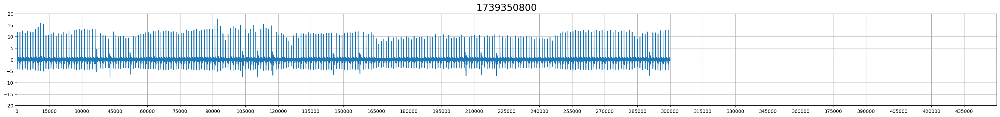

In [ ]:
read_lead = '1'
buff=fetch_lead(read_lead)*gain;
NTS = 30     ### Number of data points in a plot; 15000 for one timestamp

ND = 15000*NTS
d, c = sp.signal.butter(7, [2/500] , btype='high', analog=False); nos = (sp.signal.filtfilt(d, c, buff))*0.000286
plt.figure(0)
plt.figure(figsize=(37.0,3.5))
plt.plot(nos[0:ND])
plt.title(Timestamp,fontsize='20')
plt.ylim([-20,20]); plt.xlim([0,ND]);
plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

for i in range(1,int(len(nos)/ND)):
  plt.figure(i)
  plt.figure(figsize=(37.0,3.5))
  plt.plot(nos[(0+(ND*i)):ND*(i+1)])
  plt.title(Timestamp+(10*15),fontsize='20')
  plt.ylim([-20,20]); plt.xlim([0,ND]);
  plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

# **NEW NOISE REMOVAL 30/8/2024**

300000
Noise percentage: 5.0


<Figure size 640x480 with 0 Axes>

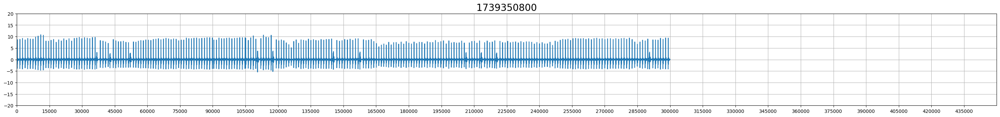

In [ ]:
def quality_check(data):  ### 0 is bad data    1 is good data
  avg_val = round(np.mean(data)); MF = 0;
  range_lower = round(np.min(data)); range_higher = round(np.max(data))
  lower_deviation = np.subtract(avg_val,range_lower); higher_deviation = np.subtract(range_higher,avg_val)
  # need to check the RR
  # if ((lower_deviation>=1) and (higher_deviation<=10 ) and (np.std(data)<1)):MF = 1
  if ((lower_deviation>=2) and (higher_deviation<=15 ) and (np.std(data)<2)):MF = 1
  return MF

def replace_noise(nos):            ############## Feed filters data as input
  clean_data = []; discard = []; d_q=[]; noise_data = []; Noise_TS = []
  temp = []  # Initialize temp to an empty array
  for i in range(0,int(len(LeadFrame)/15000)):
    st = (15000*i); en = 15000*(i+1)
    d_q = quality_check(nos[st:en])
    if d_q == 1:
      clean_data = np.concatenate((clean_data, nos[st:en]))
      temp = nos[st:en] # Update temp with current segment if it's good
    else:
      # Use the last good segment if current is bad
      if len(temp) > 0:  # Check if temp has been assigned a value before using it
          clean_data = np.concatenate((clean_data,temp))
      else:
          clean_data = np.concatenate((clean_data, nos[st:en])) # Use the current segment if no good segment has been found yet
      noise_data = np.concatenate((noise_data,nos[st:en]))
      Noise_TS.append(i)
  return clean_data, noise_data, Noise_TS

def filt_replace_Holter(raw_data,HPC = 3):
  buff=fetch_lead(read_lead)*gain               ############## Feed Raw Data as input
  d, c = sp.signal.butter(7, [HPC/500] , btype='high', analog=False); BW_filt = (sp.signal.filtfilt(d, c, buff))*0.000286
  Holter_data, noise_holter, Noise_TS = replace_noise(BW_filt);
  return Holter_data, noise_holter, Noise_TS

def plot_mult_TS(data,NTS = 10, First_TS = 1):            ############## Feed filters data as input
  ND = 15000*NTS

  plt.figure(0)
  plt.figure(figsize=(37.0,3.5))
  plt.plot(data[0:ND])
  plt.title(Timestamp,fontsize='20')
  plt.ylim([-20,20]); plt.xlim([0,ND]);
  plt.xticks(np.arange(0,ND, step=15000)); plt.grid()

  for i in range(1,int(len(nos)/ND)):
    plt.figure(i)
    plt.figure(figsize=(37.0,3.5))
    plt.plot(data[(0+(ND*i)):ND*(i+1)])
    plt.title(First_TS+(NTS*15*i),fontsize='20')
    plt.ylim([-20,20]); plt.xlim([0,ND]);
    plt.xticks(np.arange(0,ND, step=15000)); plt.grid()
  return


Holt_data1, noise_data, bad_TS = filt_replace_Holter(buff, HPC = 3);
Holt_data=noise_removal_holter(Holt_data1)
print(len(Holt_data))
plot_mult_TS(Holt_data,NTS = 30,First_TS=Timestamp);

## percentage of noisy data in read data####
No_NT=len(noise_data)
Total_TS=int(len(Holt_data1))
percentage_noise=((No_NT/Total_TS)*100)
print("Noise percentage:",percentage_noise)

# **Consolidated Code 3/12/2024**

<ipython-input-30-d1aa01130f3f>:113: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend()
<ipython-input-30-d1aa01130f3f>:115: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend()


[2, 0, 1, 1, 1, 1, 2, 10, 39, 39, 39, 39]
Total Ectopics: 174
12
Interval 1: 2024-08-15 10:50:30 - Ectopic beats: 2
Interval 2: 2024-08-15 10:55:30 - Ectopic beats: 0
Interval 3: 2024-08-15 11:00:30 - Ectopic beats: 1
Interval 4: 2024-08-15 11:05:30 - Ectopic beats: 1
Interval 5: 2024-08-15 11:10:30 - Ectopic beats: 1
Interval 6: 2024-08-15 11:15:30 - Ectopic beats: 1
Interval 7: 2024-08-15 11:20:30 - Ectopic beats: 2
Interval 8: 2024-08-15 11:25:30 - Ectopic beats: 10
Interval 9: 2024-08-15 11:30:30 - Ectopic beats: 39
Interval 10: 2024-08-15 11:35:30 - Ectopic beats: 39
Interval 11: 2024-08-15 11:40:30 - Ectopic beats: 39
Interval 12: 2024-08-15 11:45:30 - Ectopic beats: 39


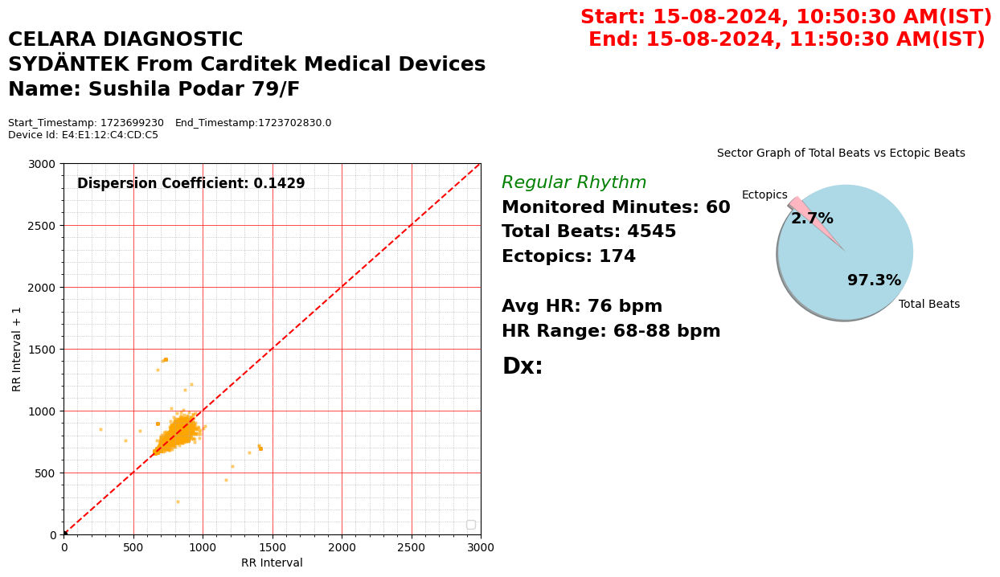

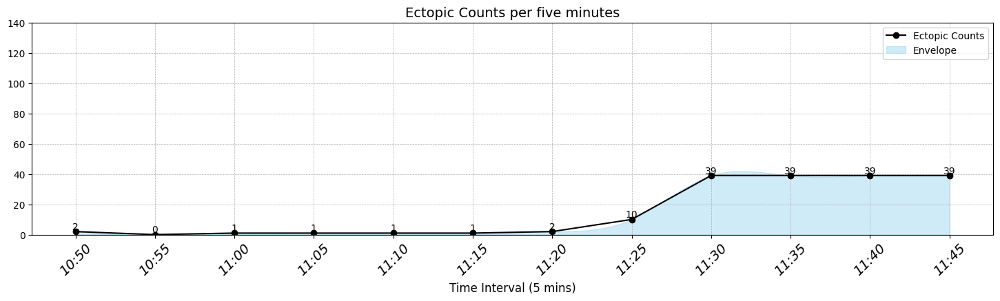

In [ ]:

from datetime import datetime, timedelta
!pip install scipy
from scipy.interpolate import CubicSpline
import matplotlib.pyplot as plt
import numpy as np
from pytz import timezone
from scipy.stats import linregress

def plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters,
                      MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2, use_uk_time=False):
    def compute_dispersion_coefficient(RR_intervals):
      std_rr = np.std(RR_intervals)  # Standard deviation
      mean_rr = np.mean(RR_intervals)  # Mean RR interval
      dispersion_coefficient = std_rr / mean_rr if mean_rr != 0 else 0
      return dispersion_coefficient

    peak_detection, ectopics = R_Peak_Detection_5_01_Holter(Holt_data)
    Rhythm = Rhythm_Check(Holt_data)
    RR_new = np.abs(np.diff(peak_detection))
    dispersion_coeff = compute_dispersion_coefficient(RR_new)
    if dispersion_coeff < 0.1:
        scatter_color = "green"  # Good rhythm
    elif dispersion_coeff < 0.25:
        scatter_color = "orange"  # Moderate rhythm
    else:
        scatter_color = "red"  # Bad rhythm
    pauses = RR_new[RR_new > 2000]
    pause_count = len(pauses)
    HR_line = HeartRate_parameters(peak_detection, RR_new, Holt_data, Fs=1000)

    fig = plt.figure(figsize=(14,6))

    # Scatter plot (left side)
    ax1 = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)

    if Rhythm == "Regular Rhythm":
        ax1.text(3150, 2800, Rhythm, fontsize=16, color="green", fontstyle='italic')
    else:
        ax1.text(3150, 2800, Rhythm, fontsize=16, color="red", fontstyle='italic')

    def remove_outliers_iqr(x, y):
        iqr_x = np.percentile(x, 100) - np.percentile(x, 10)
        iqr_y = np.percentile(y, 100) - np.percentile(y, 10)
        threshold_x = 1.5 * iqr_x
        threshold_y = 1.5 * iqr_y
        outliers = np.where((np.abs(x - np.median(x)) > threshold_x) | (np.abs(y - np.median(y)) > threshold_y))
        x_no_outliers = np.delete(x, outliers)
        y_no_outliers = np.delete(y, outliers)
        return x_no_outliers, y_no_outliers

    x_no_outliers, y_no_outliers = remove_outliers_iqr(RR_new[1:], RR_new[0:len(RR_new) - 1])

    ax1.set_xlim([0, 3000])
    ax1.set_ylim([0, 3000])
    ax1.set_xlabel('RR Interval')
    ax1.set_ylabel('RR Interval + 1')
    ax1.text(100, 2800, f"Dispersion Coefficient: {dispersion_coeff:.4f}", fontsize=12, color="black", weight='bold')
    ax1.text(-400, 3300, f"Start_Timestamp: {Timestamp}", fontsize=9, color="black")  ##
    #Fixed the error here, end_timestamp was not defined
    end_timestamp = Timestamp + len(Holt_data)/1000
    ax1.text(800,3300,f"End_Timestamp:{end_timestamp}",fontsize=9, color="black")
    ax1.text(-400, 3200, f"Device Id: {MacId}", fontsize=9, color="black")  ##
    ax1.text(-400, 3550, f"Name: {Name} {Age}", fontsize=18, color="black",weight='bold')  ##

    # Prepare the date and time display
    if use_uk_time == True:
      text = f"Start: {date}, {time}(GMT)\nEnd: {date2}, {time2}(GMT)"
      ax1.text(5200, 3950, text, horizontalalignment='center', fontsize=18, color="red",weight='bold')
    else:
      text = f"Start: {date}, {time}(IST)\nEnd: {date2}, {time2}(IST)"
      ax1.text(5200, 3950, text, horizontalalignment='center', fontsize=18, color="red",weight='bold')
    ax1.text(-400, 3750, "SYDÄNTEK From Carditek Medical Devices", fontsize=18, color="black",weight='bold')
    ax1.text(-400, 3950, "CELARA DIAGNOSTIC", fontsize=18, color="black",weight='bold')
    ax1.text(3150,1300,"Dx:",fontsize=20, color="black",weight='bold')

    # Determine the correct time zone
    if use_uk_time:
        time_zone = timezone('Europe/London')
    else:
        time_zone = timezone('Asia/Kolkata')

    # Combine date and time strings to create datetime objects
    start_datetime_str = f"{date} {time}"
    end_datetime_str = f"{date2} {time2}"
    datetime_format = "%d-%m-%Y %I:%M:%S %p"

    # Convert to datetime objects with timezone
    start_datetime = datetime.strptime(start_datetime_str, datetime_format)
    start_datetime = time_zone.localize(start_datetime)
    end_datetime = datetime.strptime(end_datetime_str, datetime_format)
    end_datetime = time_zone.localize(end_datetime)

    # Calculate monitored minutes, accounting for possible date changes
    monitored_minutes = (end_datetime - start_datetime).total_seconds() // 60
    if monitored_minutes < 0:
        # If negative, it means the end time is on the next day
        monitored_minutes += 1440  # Add 24 hours in minutes

    ax1.text(3150, 2600, f"Monitored Minutes: {int(monitored_minutes)}", fontsize=16, color="black",weight='bold')
    ax1.text(3150, 2400, f"Total Beats: {len(peak_detection)}", fontsize=16, color="black",weight='bold')
    # ax1.text(3150, 2200, f"Ectopics: {len(Total_ectopics)}", fontsize=16, color="black",weight='bold')
    ax1.text(3150, 2000, f"Pauses > 2 secs: {pause_count}", fontsize=16, color="black", weight='bold')
    ax1.text(3150, 1800, f"Avg HR: {int(HR_line[0])} bpm", fontsize=16, color="black",weight='bold')
    ax1.text(3150, 1600, f"HR Range: {int(HR_line[2])}-{int(HR_line[1])} bpm", fontsize=16, color="black",weight='bold')

    ax1.grid(which='major', linestyle='-', linewidth='0.5', color='red')
    ax1.grid(which='minor', linestyle=':', linewidth='0.5', color='darkgrey')
    ax1.minorticks_on()
    marker_size = 5
    ax1.scatter(x_no_outliers, y_no_outliers, alpha=0.6, color=scatter_color,marker='x', s=marker_size)

    # ax1.scatter(x_no_outliers, y_no_outliers, color='blue', marker='x', s=marker_size)
    ax1.legend()

    ax1.legend()

    slope, intercept, r_value, p_value, std_err = linregress(y_no_outliers, x_no_outliers)
    regression_line = [(slope * x) + intercept for x in y_no_outliers]

    # Adding the 45-degree line
    start_x = 0
    start_y = 0
    line_x = np.linspace(0, 3000, 100)
    line_y = start_y + (line_x - start_x)
    ax1.plot(line_x, line_y, color='red', linestyle='--', label='45 Degree Line')
    ax1.scatter([start_x], [start_y], color='black', zorder=5, label='Start Point')

    # Pie chart (top right)
    ax2 = plt.subplot2grid((2, 4), (0, 3))
    ax2.axis('off')  # Hide axis for pie chart
    labels = ['Total Beats', 'Ectopics']
    sizes = [len(RR_new), len(ectopics)]
    colors = ['lightblue', 'lightpink']
    explode = (0.1, 0)  # "explode" the first slice
    def large_bold_autopct(pct):
        return f'{pct:.1f}%'
    # Plot the pie chart
    wedges, texts, autotexts = ax2.pie(
    sizes, explode=explode, labels=labels, colors=colors,
    autopct=large_bold_autopct, shadow=True, startangle=140)

    # Adjust font properties of percentage labels
    for autotext in autotexts:
     autotext.set_fontsize(14)  # Increase font size
     autotext.set_fontweight('bold')  # Make font bold
     autotext.set_color('black')  # Set color of percentage text

    ax2.set_title('Sector Graph of Total Beats vs Ectopic Beats', fontsize=10)

    # Bar chart (bottom right)

    Timestamp_start = Timestamp
    samples_per_5min = 5 * 60 * 1000
    start_time = datetime.utcfromtimestamp(Timestamp)   ### UK time
    start_time = datetime.utcfromtimestamp(Timestamp_start) + timedelta(hours=5, minutes=30)  ### indian time
    intervals = int(np.ceil(len(Holt_data) / samples_per_5min))
    ectopic_counts_per_interval = [0] * intervals
    ectopic_count = []
    chunk_size = 20 * 15000
    for i in range(0, len(Holt_data), chunk_size):
      start_idx = i
      end_idx = min(i + chunk_size, len(Holt_data))
      chunk = Holt_data[start_idx:end_idx]
      peak, ectopic_count_in_chunk = R_Peak_Detection_05(chunk)
      ectopic_count.extend(ectopic_count_in_chunk)

    # Count ectopic beats in each 5-minute interval
    for i in range(intervals):
        interval_start = i * samples_per_5min
        interval_end = min((i + 1) * samples_per_5min, len(Holt_data))
        interval_chunk = Holt_data[interval_start:interval_end]
        peak, ectopic_count_in_interval = R_Peak_Detection_05(interval_chunk)
        ectopic_counts_per_interval[i] = len(ectopic_count_in_interval)

    print(ectopic_counts_per_interval)
    Total_ectopics=np.sum(ectopic_counts_per_interval)
    ax1.text(3150, 2200, f"Ectopics: {Total_ectopics}", fontsize=16, color="black",weight='bold')
    print("Total Ectopics:",Total_ectopics)
    print(len(ectopic_counts_per_interval))

    for i in range(intervals):
      interval_time = start_time + timedelta(minutes=5 * i)
      print(f"Interval {i + 1}: {interval_time} - Ectopic beats: {ectopic_counts_per_interval[i]}")

    time_intervals = [start_time + timedelta(minutes=5 * i) for i in range(len(ectopic_counts_per_interval))]
    time_intervals = [start_datetime + timedelta(minutes=5 * i) for i in range(len(ectopic_counts_per_interval))]
    time_labels = [time.astimezone(time_zone).strftime('%H:%M') for time in time_intervals]

    # Convert time intervals in string pattern
    time_labels = [time.strftime('%H:%M') for time in time_intervals]
    time_intervals = np.arange(len(ectopic_counts_per_interval))


    def envelope(data):
      # Use the time intervals as the x-axis
      x = np.arange(len(data))
      y = np.array(data)

      # Check if x has enough elements
      if len(x) < 2:

        return x,y
      # Apply cubic spline interpolation
      cs = CubicSpline(x, y, bc_type='natural')  # 'natural' means second derivatives are zero at the endpoints

      # Generate smooth curve for the envelope
      smooth_x = np.linspace(0, len(data)-1, 500)  # More points for smooth curve
      smooth_y = cs(smooth_x)

      return smooth_x, smooth_y

    t, u = envelope(np.array(ectopic_counts_per_interval))

    # Plotting the ectopic counts with the envelope
    plt.figure(figsize=(18, 4))

    # Plot the ectopic counts as a line
    plt.plot(time_intervals, ectopic_counts_per_interval, label='Ectopic Counts', color='black', marker='o')

    # Plot the envelope as a filled area under the curve
    plt.fill_between(t, u, color='skyblue', alpha=0.4, label='Envelope')

    # Labels and title
    plt.xlabel('Time Interval (5 mins)', fontsize=12)
    plt.xticks(range(len(time_labels)))
    plt.gca().set_xticklabels(time_labels, rotation=45, fontsize=14, fontstyle='italic')
    plt.title('Ectopic Counts per five minutes', fontsize=14)

    # Add grid and legend
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.ylim([0, 140])
    plt.legend()

    # Annotate each point with its ectopic count
    for i, count in enumerate(ectopic_counts_per_interval):
        plt.text(time_intervals[i], count, str(count), ha='center', va='bottom', fontsize=10, color='black')



plot_scatter_plot(Holt_data, R_Peak_Detection_05, Rhythm_Check, HeartRate_parameters, MacId, Timestamp, TrialId, Name, Age, date, time, date2, time2,use_uk_time=False)
Filename='scatter_plot'
plt.savefig(('/content/drive/MyDrive/Carditek Report for Celara/Scatter Plots/Short_Scatter/'+date+'_'+TrialId+'_'+Name+'_'+Filename+'.pdf'), bbox_inches='tight')

# **Indian Time**

Outlier RR Intervals: [1406 1402  265  442 1168 1015  551 1212 1332 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416 1416
 1416 1416 1416 1416 1416 1416 1416 1416]
Outlier Peak Locations: [   2144    4271  468487  714855  715297 1778827 1954563 1955114 2353901
 2362645 2377645 2392645 2407645 2422645 2437645 2452645 2467645 2482645
 2497645 2512645 2527645 2542645 2557645 2572645 2587645 2602645 2617645
 2632645 2647645 2662645 2677645 2692645 2707645 2722645 2737645 2752645
 2767645 2782645 2797645 2812645 2827645 2842645 2857645 2872645 2887645
 2902645 2917645 2932645 2947645 2962645 2977645 2992645 3007645 3022645
 3037645 3052645 3067645 3082645 3097645 3112645

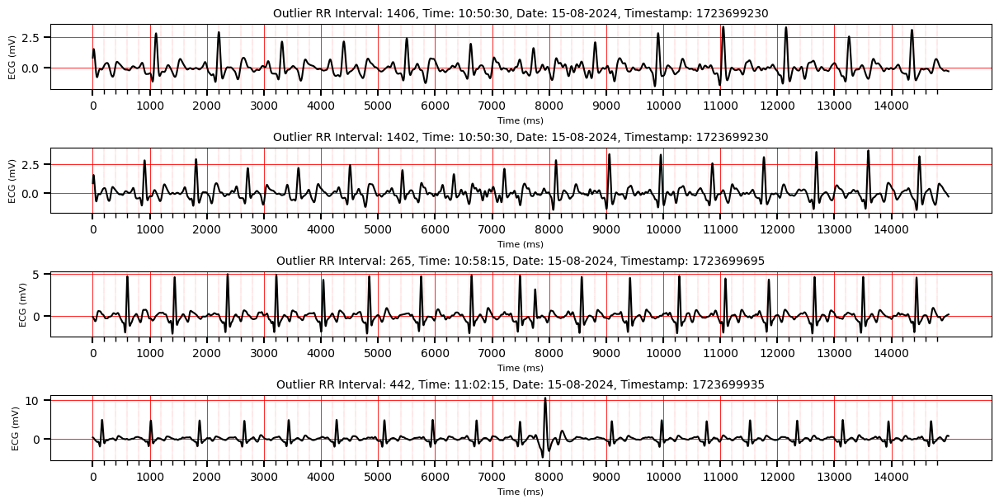

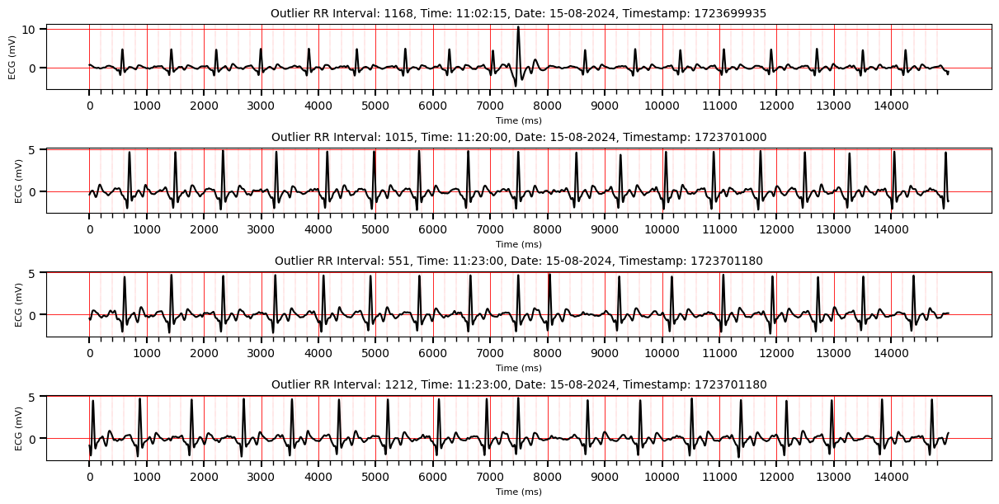

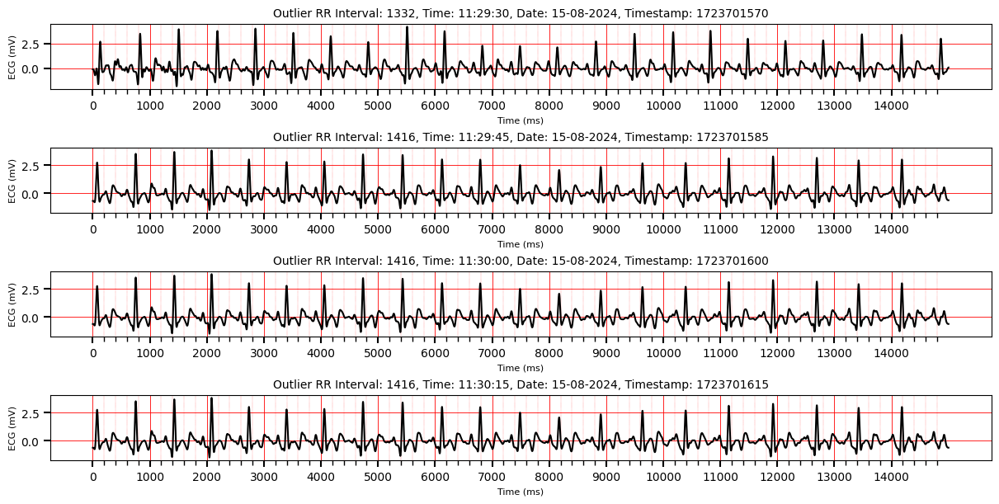

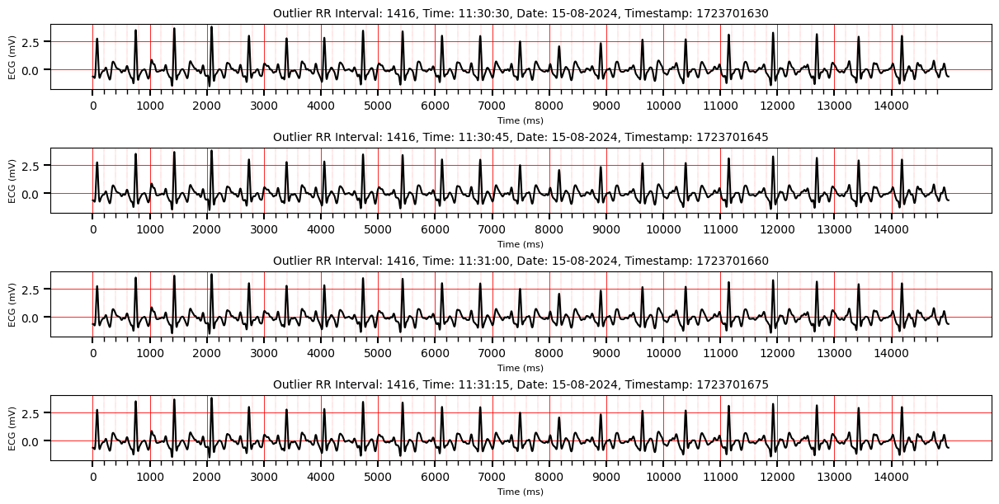

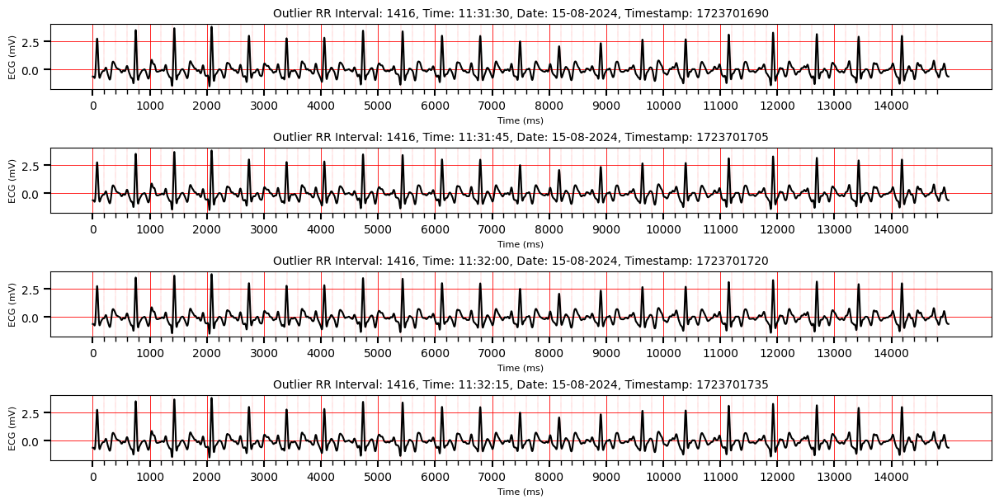

...

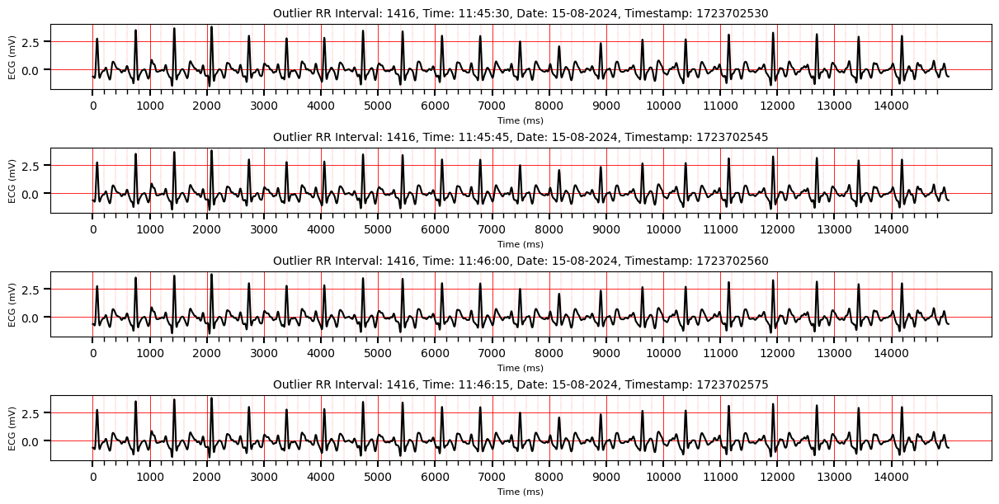

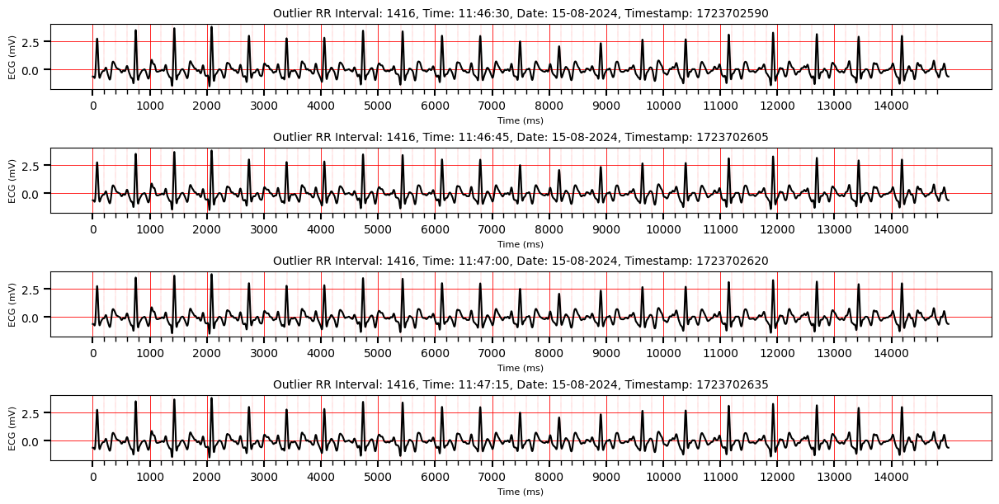

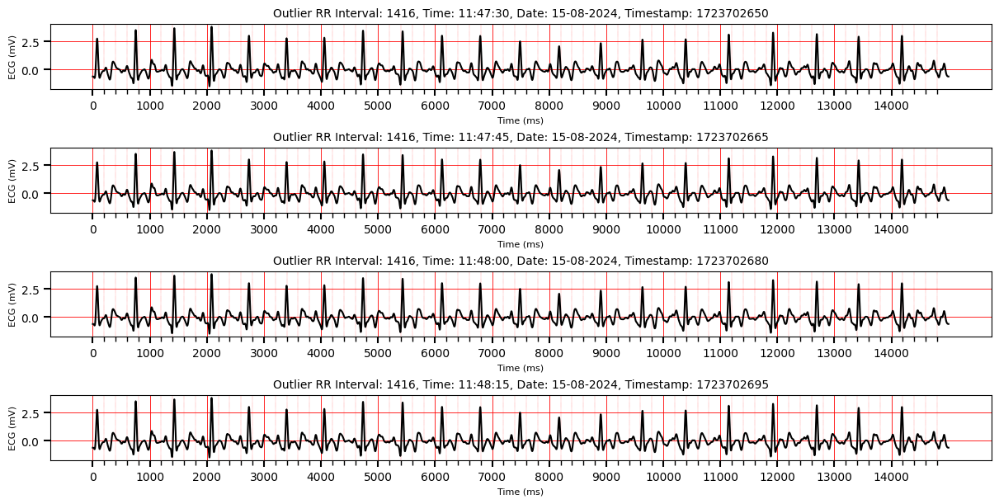

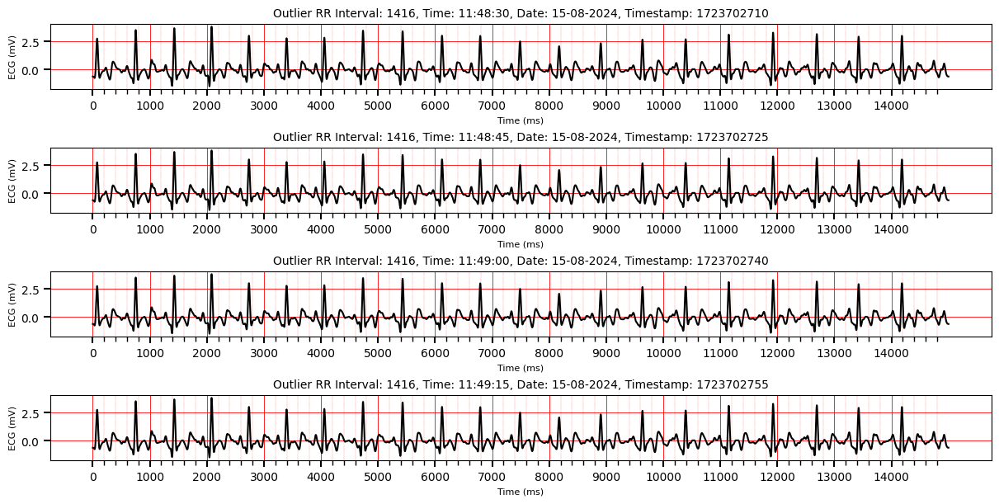

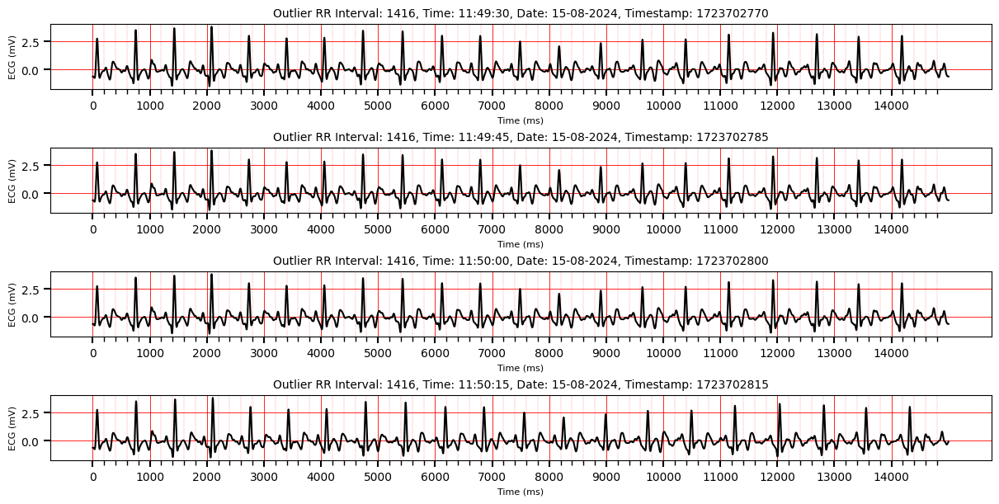

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
Timestamp_start =Timestamp

# Peak Detection and RR Intervals
peak_detection, ectopics = R_Peak_Detection_5_01_Holter(Holt_data)
RR_intervals = np.abs(np.diff(peak_detection))

# Finding Upper and Lower Limits
mean_rr = np.mean(RR_intervals)
std_rr = np.std(RR_intervals)
upper_limit = mean_rr + 1.96 * std_rr  # 2 standard deviations for upper limit
lower_limit = mean_rr - 1.96 * std_rr  # 2 standard deviations for lower limit

# Identifying Outliers
outliers = (RR_intervals > upper_limit) | (RR_intervals < lower_limit)

# Outlier Data
outlier_RR_intervals = RR_intervals[outliers]
outlier_peak_locations = np.array(peak_detection[:-1])[outliers]
print("Outlier RR Intervals:", outlier_RR_intervals)
print("Outlier Peak Locations:", outlier_peak_locations)

# R-Peak Location from Buffer Data
buffer_peak_locations = np.array(Holt_data)  # Assuming buffer_data contains the locations
print(buffer_peak_locations)

sample_rate = 1000
timestamp_interval = 15  # seconds
first_timestamp = Timestamp

intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)
print(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = first_timestamp + (interval * timestamp_interval)
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)

# # Print outlier timestamps with RR interval numbering
# print("Outlier Timestamps with RR interval numbering:")
# for idx, timestamp in enumerate(outlier_timestamps, 1):
#     print(f"RR Interval {idx}: {timestamp}")

# Print outlier timestamps with RR interval numbering and RR Interval value
print("Outlier Timestamps with RR interval value:")
for idx, (interval, timestamp, rr_value) in enumerate(zip(intervals, outlier_timestamps, outlier_RR_intervals), 1):
    print(f"Index {idx}, RR Interval Value {rr_value}: {timestamp}")

# Assuming Holt_data and R_Peak_Detection_05 are already defined and available
Timestamp_start = Timestamp_start  # Ensure this is properly initialized


# Define function to format timestamps
def get_time_from_timestamp(timestamp):
    read_able = datetime.fromtimestamp(timestamp, tz=timezone('Asia/Kolkata'))
    date_string = read_able.strftime("%d-%m-%Y")
    time_string = read_able.strftime("%H:%M:%S")
    return (date_string, time_string, timestamp)

# ECG Paper Speed
sample_rate = 1000  # 1000 Hz (1 sample per ms)
ecg_segment_duration = 15 * sample_rate  # 15 seconds of ECG data

# Define grid spacing based on standard ECG paper (25 mm/s)
large_box_ms = 1000  # Major ticks every **1000 ms** (5 large boxes)
small_box_ms = 200   # Minor ticks every 200 ms

subplots_per_figure = 4  # Fewer subplots for better clarity
total_outliers = len(outlier_peak_locations)
num_figures = int(np.ceil(total_outliers / subplots_per_figure))

for fig_num in range(num_figures):
    num_subplots = min(subplots_per_figure, total_outliers - fig_num * subplots_per_figure)
    fig, axes = plt.subplots(num_subplots, 1, figsize=(12, 6), constrained_layout=True)  # **Reduced white space**

    if num_subplots == 1:
        axes = [axes]

    for i in range(num_subplots):
        index = fig_num * subplots_per_figure + i
        if index >= total_outliers:
            break

        peak = outlier_peak_locations[index]
        start = int(max(0, peak - ecg_segment_duration // 2))
        end = int(min(len(Holt_data), peak + ecg_segment_duration // 2))

        ecg_segment = Holt_data[start:end]
        timestamps = np.linspace(0, 15 * 1000, len(ecg_segment))  # Convert to ms for correct scaling

        date, time, original_timestamp = get_time_from_timestamp(outlier_timestamps[index])

        ax = axes[i]
        ax.plot(timestamps, ecg_segment, color='black')

        ax.set_title(f"Outlier RR Interval: {int(outlier_RR_intervals[index])}, Time: {time}, Date: {date}, Timestamp: {original_timestamp}",
                     fontsize=10)

        ax.set_xlabel("Time (ms)", fontsize=8)
        ax.set_ylabel("ECG (mV)", fontsize=8)

        # **Set grid and ticks for ECG calibration**
        ax.set_xticks(np.arange(0, 15000, large_box_ms))  # **Major ticks every 1000 ms**
        ax.set_xticks(np.arange(0, 15000, small_box_ms), minor=True)  # **Minor ticks every 200 ms**

        ax.grid(which='major', linestyle='-', linewidth=0.6, color='red')
        ax.grid(which='minor', linestyle=':', linewidth=0.3, color='red')

        ax.tick_params(axis='both', which='major', colors='black', length=6, width=1.5)
        ax.tick_params(axis='both', which='minor', colors='black', length=4, width=1)

        # **Show only every 1000 ms label**
        ax.set_xticklabels([int(tick) if tick % 1000 == 0 else '' for tick in ax.get_xticks()])

    plt.show()


# **UK Time**

Outlier RR Intervals: [1080  393  272  372  884  370  998  448  890  484  484  967 1259  932
  512  412  298  482  237  594 1191  255  570  461  352  688  682  680
  688  325  692  686  679  675  682  692  320  681  668  667  671  680
 1001  565  525  917  688  304 1455  461  292  812]
Outlier Peak Locations: [ 569599  584599  584992 1199874 1214108 1214992 1865235 2009988 2024216
 2114839 2129839 2144838 2204306 2230815 2231747 2234406 2234818 2412821
 2413303 2474445 2489445 2521086 2564532 2579532 2579993 2811551 2812239
 2812921 2813601 3230638 3489763 3490455 3491141 3491820 3492495 3493177
 3886037 4242530 4243211 4243879 4244546 4245217 4541121 4979481 5001349
 5001874 5004923 5197007 5208969 5244869 5245330 5293934]
[0.27128994 0.23168382 0.19511245 ... 0.32205808 0.32130883 0.32196726]
[ 37  38  38  79  80  80 124 133 134 140 141 142 146 148 148 148 148 160
 160 164 165 168 170 171 171 187 187 187 187 215 232 232 232 232 232 232
 259 282 282 282 282 283 302 331 333 333 333 346

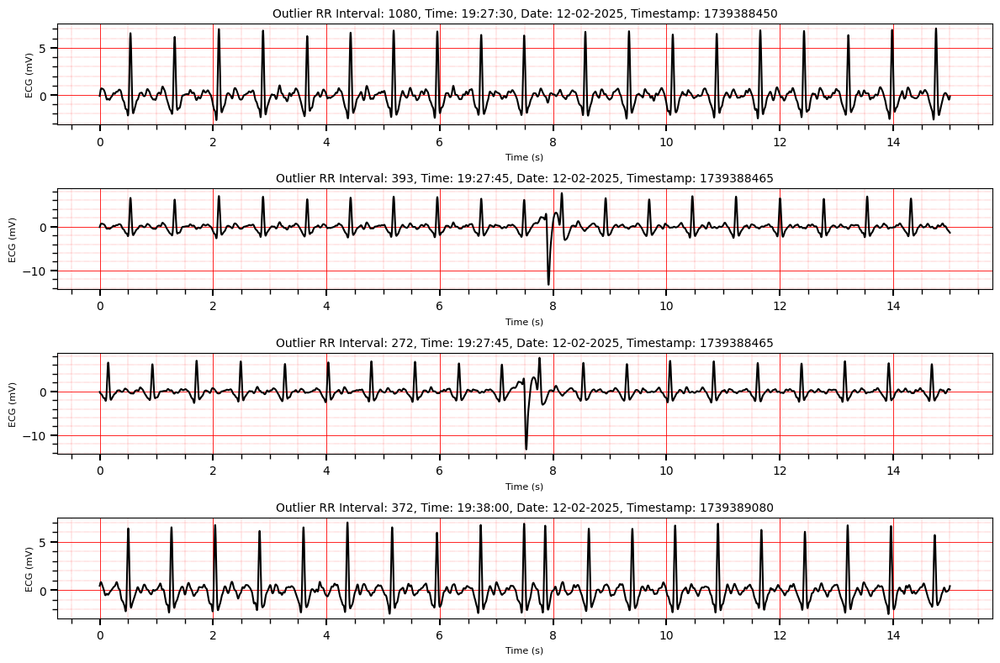

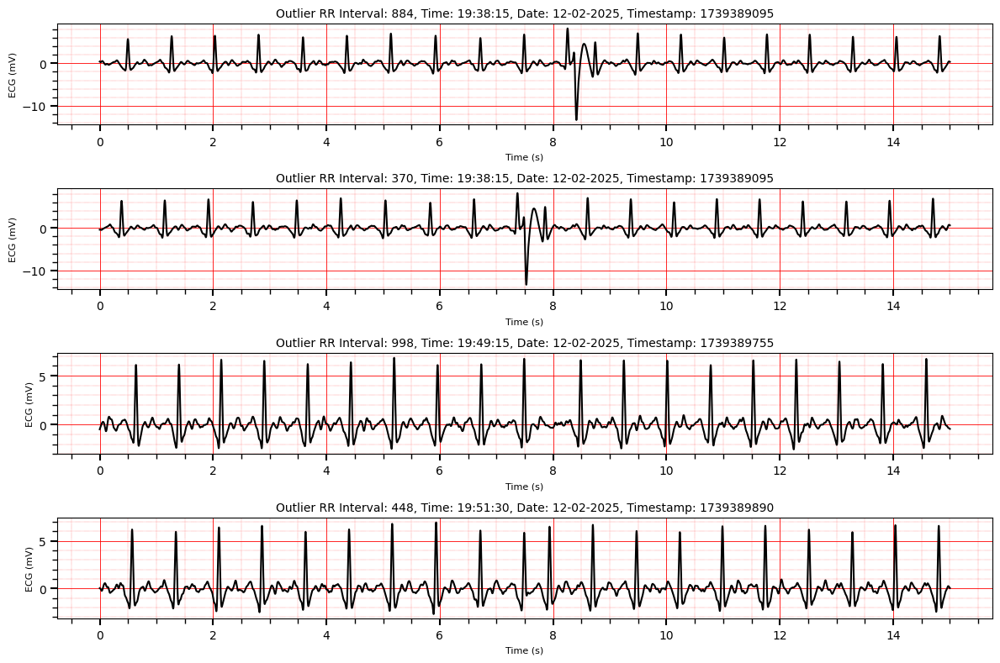

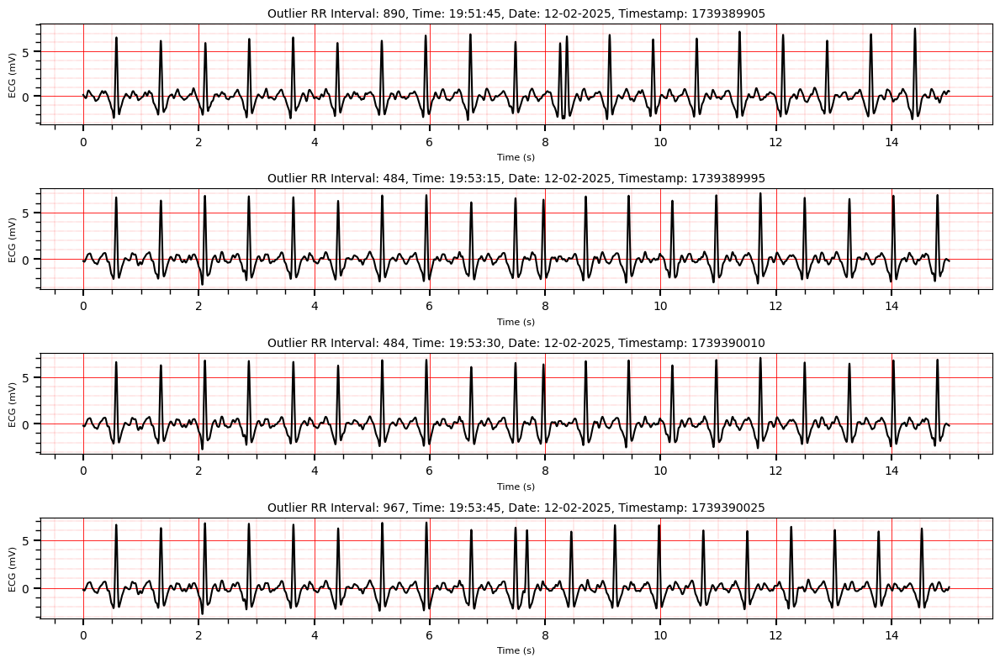

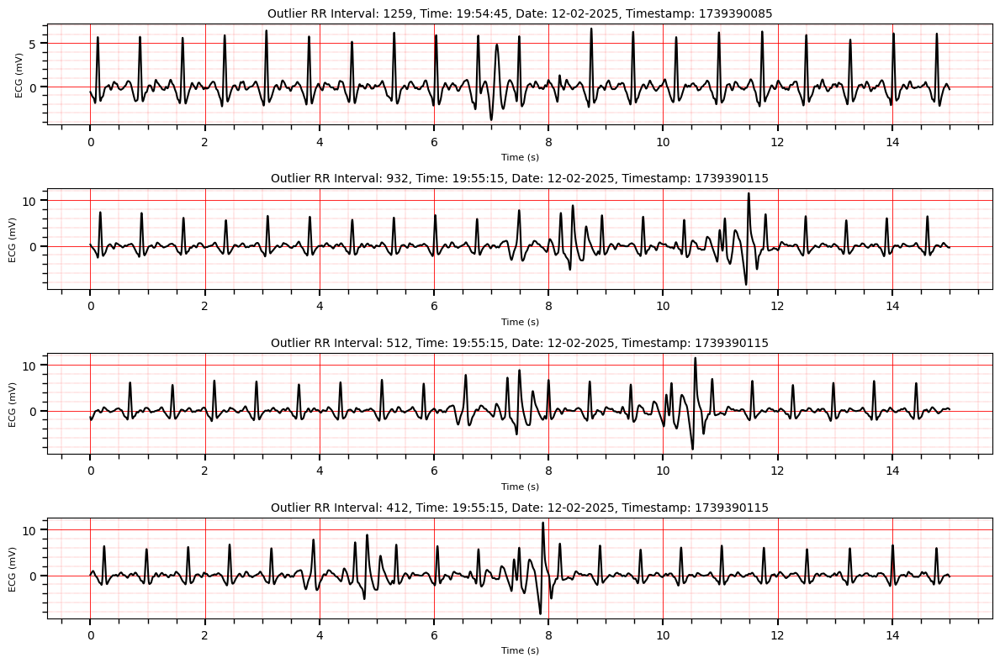

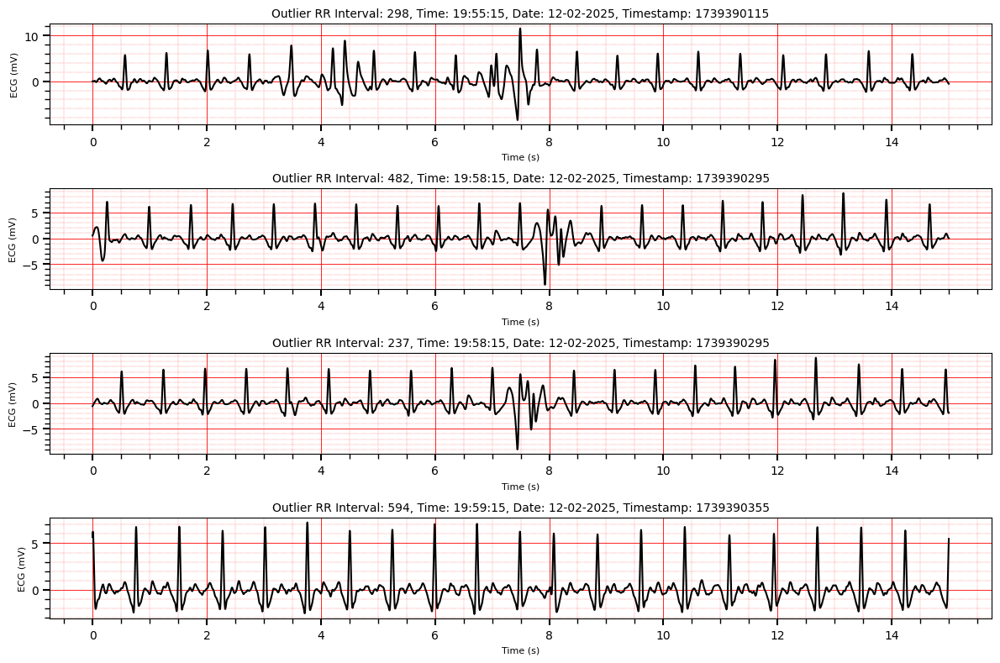

...

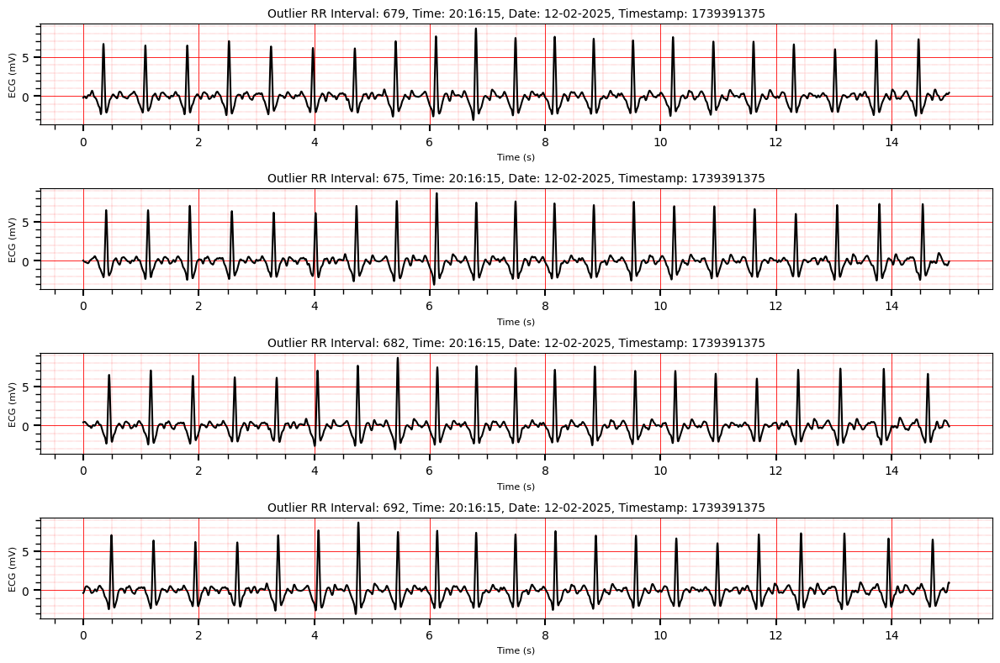

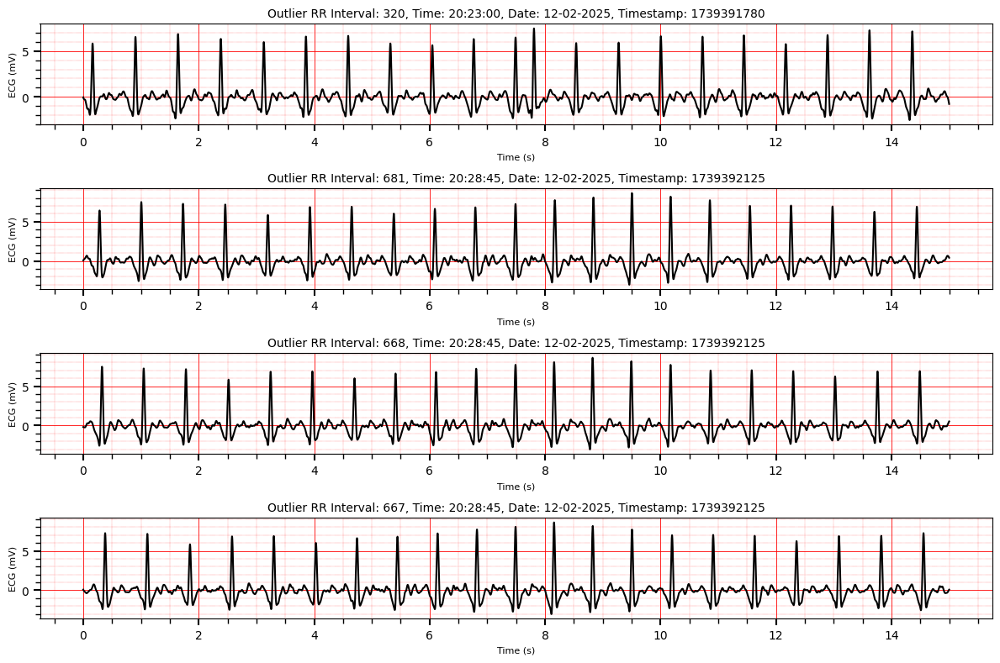

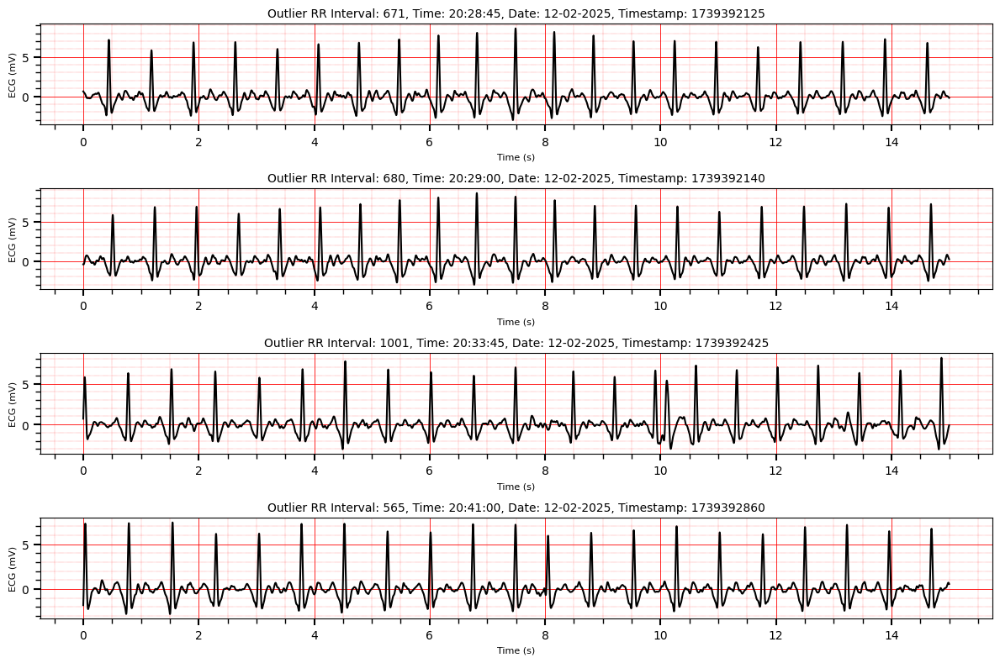

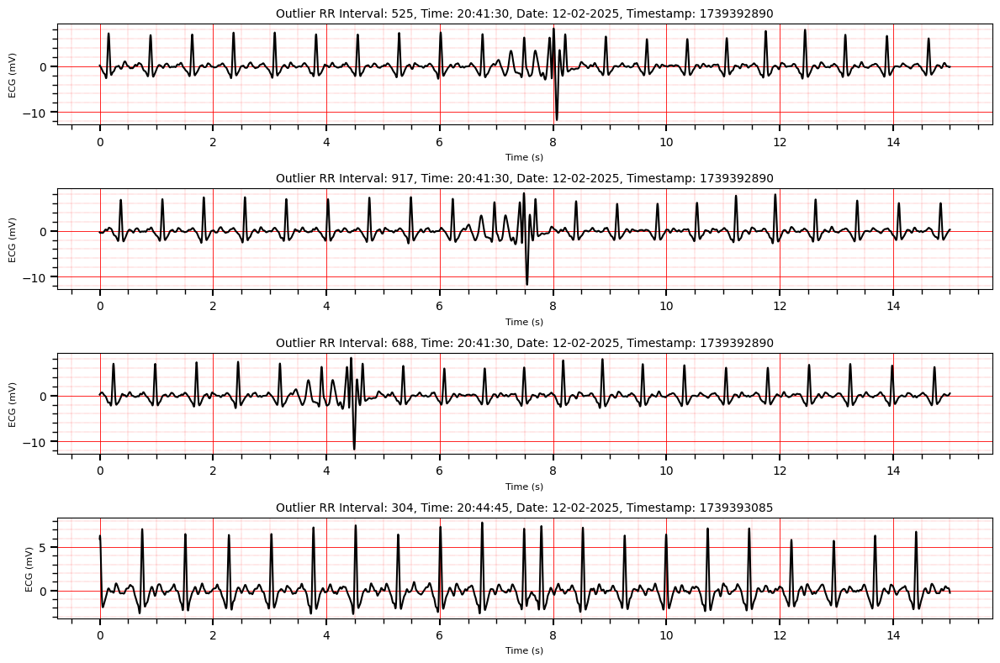

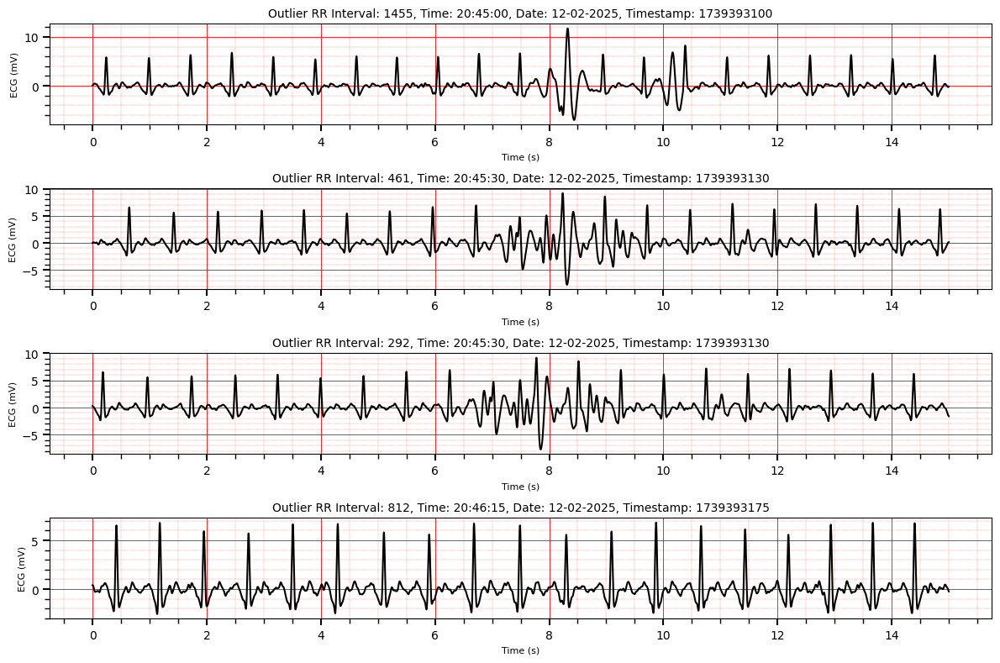

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone


Timestamp_start =Timestamp  # Ensure this is properly initialized

# Define the function to convert timestamps into human-readable UK format
def get_time_from_timestamp_UK(timestamp):
    # Convert timestamp to datetime object in 'Asia/Kolkata' timezone
    read_able = datetime.fromtimestamp(timestamp, timezone('Asia/Kolkata'))

    # Convert to 'Europe/London' timezone
    now_london = str(read_able.astimezone(timezone('Europe/London')))  # Convert to string

    # Extract the date and format it as 'dd-mm-yyyy'
    year = now_london[0:10]
    year = year[8:10] + "-" + year[5:7] + "-" + year[0:4]

    # Extract the time in 'hh:mm:ss' format
    time_string = now_london[11:19]

    return (year, time_string, timestamp)

# Peak Detection and RR Intervals
peak_detection, ectopics = R_Peak_Detection_5_01_Holter(Holt_data)
RR_intervals = np.abs(np.diff(peak_detection))

# Finding Upper and Lower Limits
mean_rr = np.mean(RR_intervals)
std_rr = np.std(RR_intervals)
upper_limit = mean_rr + 1.96 * std_rr  # 2 standard deviations for upper limit
lower_limit = mean_rr - 1.96 * std_rr  # 2 standard deviations for lower limit

# Identifying Outliers
outliers = (RR_intervals > upper_limit) | (RR_intervals < lower_limit)

# Outlier Data
outlier_RR_intervals = RR_intervals[outliers]
outlier_peak_locations = np.array(peak_detection[:-1])[outliers]
print("Outlier RR Intervals:", outlier_RR_intervals)
print("Outlier Peak Locations:", outlier_peak_locations)


# R-Peak Location from Buffer Data
buffer_peak_locations = np.array(Holt_data)  # Assuming buffer_data contains the locations
print(buffer_peak_locations)

sample_rate = 1000
timestamp_interval = 15  # seconds
first_timestamp = Timestamp

intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)
print(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = first_timestamp + (interval * timestamp_interval)
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)


# Extract 15-second ECG segments around each outlier
sample_rate = 1000  # 1000 Hz sample rate
ecg_segment_duration = 15 * sample_rate  # 15 seconds of ECG data

# Calculate intervals and timestamps
intervals = []
for i in range(len(outlier_peak_locations)):
    peak = outlier_peak_locations[i]
    interval = int(peak / (sample_rate * 15))
    intervals.append(interval)
intervals = np.array(intervals)

outlier_timestamps = []
for j in range(len(intervals)):
    interval = intervals[j]
    timestamp = int(Timestamp_start + (interval * timestamp_interval))  # Convert to int for no decimal
    outlier_timestamps.append(timestamp)
outlier_timestamps = np.array(outlier_timestamps)

# Splitting the subplots into smaller groups for better readability
subplots_per_figure = 4  # Smaller number of subplots per figure
total_outliers = len(outlier_peak_locations)
num_figures = int(np.ceil(total_outliers / subplots_per_figure))

for fig_num in range(num_figures):
    num_subplots = min(subplots_per_figure, total_outliers - fig_num * subplots_per_figure)
    fig, axes = plt.subplots(num_subplots, 1, figsize=(12, 6), constrained_layout=True)  # **Reduced white space**

    if num_subplots == 1:
        axes = [axes]

    for i in range(num_subplots):
        index = fig_num * subplots_per_figure + i
        if index >= total_outliers:
            break

        peak = outlier_peak_locations[index]
        start = int(max(0, peak - ecg_segment_duration // 2))
        end = int(min(len(Holt_data), peak + ecg_segment_duration // 2))

        ecg_segment = Holt_data[start:end]
        timestamps = np.linspace(0, 15 * 1000, len(ecg_segment))  # Convert to ms for correct scaling

        date, time, original_timestamp = get_time_from_timestamp(outlier_timestamps[index])

        ax = axes[i]
        ax.plot(timestamps, ecg_segment, color='black')

        ax.set_title(f"Outlier RR Interval: {int(outlier_RR_intervals[index])}, Time: {time}, Date: {date}, Timestamp: {original_timestamp}",
                     fontsize=10)

        ax.set_xlabel("Time (ms)", fontsize=8)
        ax.set_ylabel("ECG (mV)", fontsize=8)

        # **Set grid and ticks for ECG calibration**
        ax.set_xticks(np.arange(0, 15000, large_box_ms))  # **Major ticks every 1000 ms**
        ax.set_xticks(np.arange(0, 15000, small_box_ms), minor=True)  # **Minor ticks every 200 ms**

        ax.grid(which='major', linestyle='-', linewidth=0.6, color='red')
        ax.grid(which='minor', linestyle=':', linewidth=0.3, color='red')

        ax.tick_params(axis='both', which='major', colors='black', length=6, width=1.5)
        ax.tick_params(axis='both', which='minor', colors='black', length=4, width=1)

        # **Show only every 1000 ms label**
        ax.set_xticklabels([int(tick) if tick % 1000 == 0 else '' for tick in ax.get_xticks()])

    plt.show()